# 03 Strict Validation And Test Model Comparison

This notebook loads strict protocol artifacts from separate training notebooks: table models from `02_table_model_forecasting.ipynb`, per-ticker LSTM from `02b_lstm_forecasting.ipynb`, and optional global LSTM from `02c_global_lstm_forecasting.ipynb`. Validation metrics are used for model-selection diagnostics, while test metrics remain out-of-sample evaluation.


In [1]:
from pathlib import Path
import sys

cwd = Path.cwd().resolve()
for candidate in [cwd, cwd / "forecasting", cwd.parent, cwd.parent / "forecasting"]:
    if (candidate / "src" / "stock_forecast").exists():
        PROJECT_DIR = candidate
        break
else:
    raise RuntimeError("Cannot locate forecasting project directory with src/stock_forecast")

SRC_DIR = PROJECT_DIR / "src"
if str(SRC_DIR) not in sys.path:
    sys.path.insert(0, str(SRC_DIR))

ARTIFACT_DIR = PROJECT_DIR / "artifacts"
DATA_DIR = ARTIFACT_DIR / "data"
REPORTS_DIR = ARTIFACT_DIR / "reports"
PLOTS_DIR = ARTIFACT_DIR / "plots"
for path in [DATA_DIR, REPORTS_DIR, PLOTS_DIR]:
    path.mkdir(parents=True, exist_ok=True)

print(f"PROJECT_DIR = {PROJECT_DIR}")

PROJECT_DIR = /home/sapce/forecasting_stock_prices/forecasting


In [2]:
from pathlib import Path
import json
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

from stock_forecast.artifacts import load_json, load_table, save_json, save_table
from stock_forecast.backtest import run_seeded_panel_signal_backtest, run_test_signal_backtest

pd.set_option("display.max_columns", 160)
plt.style.use("default")


## Notebook Constants

In [3]:
PRIMARY_METRIC = "directional_accuracy"
HORIZONS = [
    {"name": "week", "horizon": 5},
    {"name": "month", "horizon": 21},
]
MAX_TICKER_PLOTS = None
SCATTER_SAMPLE = 5000
PROFIT_INITIAL_CAPITAL = 100_000.0
PREDICTION_METRIC_COLS = ["mae", "rmse", "r2", "pearson", "spearman", "directional_accuracy"]
SIGNAL_METRIC_COLS = ["cumulative_return", "annualized_return", "annualized_volatility", "sharpe", "sortino", "max_drawdown", "calmar", "turnover", "number_of_trades", "n_rebalances"]
SIGNAL_COMPARISON_COLS = ["cumulative_return", "annualized_return", "sharpe", "sortino", "max_drawdown", "calmar", "turnover", "number_of_trades"]
VALIDATION_BAR_METRIC_COLS = ["sharpe", "sortino", "calmar", "cumulative_return", "max_drawdown", "turnover", "number_of_trades"]
HEADLINE_SIGNAL_MODE = "overlapping_tranches"
TRANSACTION_COST_BPS = 10.0
SLIPPAGE_BPS = 5.0
LONG_THRESHOLD = 0.0
SIGNAL_ANCHOR = "expanding_median"
TABLE_COMPARISON_SOURCE = "table"
LSTM_ONLY_ARTIFACT_NAME = "lstm_only"
GLOBAL_LSTM_ARTIFACT_NAME = "global_lstm"


## Load Separate Strict Test Artifacts


In [4]:
def table_exists(path: Path) -> bool:
    return path.exists() or path.with_suffix(".csv").exists()


def safe_filename(value: str) -> str:
    return re.sub(r"[^A-Za-z0-9_.-]+", "_", str(value)).strip("._") or "ticker"


def add_comparison_source(frame: pd.DataFrame, source: str) -> pd.DataFrame:
    out = frame.copy()
    if not out.empty:
        out["comparison_source"] = source
    return out


def concat_metric_frames(frames: list[pd.DataFrame]) -> pd.DataFrame:
    clean = [frame for frame in frames if frame is not None and not frame.empty]
    return pd.concat(clean, ignore_index=True, sort=False) if clean else pd.DataFrame()


def normalize_date_columns(frame: pd.DataFrame) -> pd.DataFrame:
    out = frame.copy()
    for col in ["date", "signal_date", "entry_date", "target_date", "train_start", "train_end"]:
        if col in out.columns:
            out[col] = pd.to_datetime(out[col])
    return out


def load_optional_table(path: Path) -> pd.DataFrame:
    return load_table(path) if table_exists(path) else pd.DataFrame()


def drop_model_rows(frame: pd.DataFrame, model_names: set[str]) -> pd.DataFrame:
    if frame.empty or "model_name" not in frame.columns:
        return frame.copy()
    return frame[~frame["model_name"].astype(str).isin(model_names)].copy()


def best_params_with_source(rows: list[dict], source: str, drop_model_names: set[str] | None = None) -> list[dict]:
    drop_model_names = drop_model_names or set()
    out = []
    for row in rows:
        if str(row.get("model_name")) in drop_model_names:
            continue
        item = dict(row)
        item["comparison_source"] = source
        out.append(item)
    return out


PER_TICKER_REQUIRED_FILES = [
    "outer_splits.parquet",
    "validation_predictions.parquet",
    "test_predictions.parquet",
    "validation_model_ranking.parquet",
    "validation_prediction_metrics.parquet",
    "selected_models_by_ticker.parquet",
    "test_prediction_metrics.parquet",
    "test_signal_equity.parquet",
    "test_signal_metrics.parquet",
    "leakage_audit.parquet",
]
GLOBAL_REQUIRED_FILES = [
    "validation_predictions.parquet",
    "test_predictions.parquet",
    "validation_prediction_metrics.parquet",
    "test_prediction_metrics.parquet",
    "validation_signal_metrics.parquet",
    "test_signal_metrics.parquet",
    "validation_panel_signal_metrics.parquet",
    "test_panel_signal_metrics.parquet",
    "leakage_audit.parquet",
]
METRIC_DIRECTIONS = {
    "mae": "min",
    "rmse": "min",
    "r2": "max",
    "pearson": "max",
    "spearman": "max",
    "directional_accuracy": "max",
}


def load_per_ticker_artifacts(
    *,
    reports_dir: Path,
    source: str,
    missing_hint: str,
    drop_stale_lstm: bool = False,
) -> dict:
    missing = [name for name in PER_TICKER_REQUIRED_FILES if not table_exists(reports_dir / name)]
    if missing:
        raise FileNotFoundError(f"Missing {source} strict artifacts: {missing}. {missing_hint}")

    out = {
        "reports_dir": reports_dir,
        "outer_splits": load_table(reports_dir / "outer_splits.parquet"),
        "validation_predictions": load_table(reports_dir / "validation_predictions.parquet"),
        "test_predictions": load_table(reports_dir / "test_predictions.parquet"),
        "validation_model_ranking": load_table(reports_dir / "validation_model_ranking.parquet"),
        "selected_models_by_ticker": load_table(reports_dir / "selected_models_by_ticker.parquet"),
        "validation_prediction_metrics": load_table(reports_dir / "validation_prediction_metrics.parquet"),
        "test_prediction_metrics": load_table(reports_dir / "test_prediction_metrics.parquet"),
        "test_signal_equity": load_table(reports_dir / "test_signal_equity.parquet"),
        "test_signal_metrics": load_table(reports_dir / "test_signal_metrics.parquet"),
        "leakage_audit": load_table(reports_dir / "leakage_audit.parquet"),
    }
    frame_names = [
        "validation_predictions",
        "test_predictions",
        "validation_model_ranking",
        "selected_models_by_ticker",
        "validation_prediction_metrics",
        "test_prediction_metrics",
        "test_signal_equity",
        "test_signal_metrics",
        "leakage_audit",
    ]
    drop_names = {"lstm"} if drop_stale_lstm else set()
    for frame_name in frame_names:
        frame = normalize_date_columns(out[frame_name])
        if drop_names:
            frame = drop_model_rows(frame, drop_names)
        out[frame_name] = add_comparison_source(frame, source)

    best_param_rows = load_json(reports_dir / "best_params.json") if (reports_dir / "best_params.json").exists() else []
    out["best_params"] = best_params_with_source(best_param_rows, source, drop_model_names=drop_names)
    return out


def rank_per_ticker_models(validation_metrics: pd.DataFrame) -> pd.DataFrame:
    if validation_metrics.empty:
        return pd.DataFrame()
    if PRIMARY_METRIC not in validation_metrics.columns:
        raise ValueError(f"Missing primary metric column in validation metrics: {PRIMARY_METRIC}")
    ascending = METRIC_DIRECTIONS.get(PRIMARY_METRIC, "min") == "min"
    ranking = validation_metrics.copy()
    ranking = ranking.rename(columns={PRIMARY_METRIC: f"validation_{PRIMARY_METRIC}"})
    sort_cols = ["ticker", f"validation_{PRIMARY_METRIC}"]
    sort_ascending = [True, ascending]
    if PRIMARY_METRIC != "directional_accuracy" and "directional_accuracy" in ranking.columns:
        sort_cols.append("directional_accuracy")
        sort_ascending.append(False)
    if PRIMARY_METRIC != "rmse" and "rmse" in ranking.columns:
        sort_cols.append("rmse")
        sort_ascending.append(True)
    if "comparison_source" in ranking.columns:
        sort_cols.append("comparison_source")
        sort_ascending.append(True)
    sort_cols.append("model_name")
    sort_ascending.append(True)
    ranking = ranking.sort_values(sort_cols, ascending=sort_ascending)
    ranking["selection_scope"] = "per_ticker"
    ranking["validation_rank"] = ranking.groupby("ticker").cumcount() + 1
    ranking["is_validation_selected"] = ranking["validation_rank"].eq(1)
    return ranking


def enrich_test_metrics_with_ranking(test_metrics: pd.DataFrame, ranking: pd.DataFrame) -> pd.DataFrame:
    if test_metrics.empty or ranking.empty:
        return test_metrics.copy()
    out = test_metrics.copy()
    drop_cols = ["validation_rank", "is_validation_selected", f"validation_{PRIMARY_METRIC}"]
    out = out.drop(columns=[col for col in drop_cols if col in out.columns])
    merge_cols = ["ticker", "model_name"]
    if "comparison_source" in out.columns and "comparison_source" in ranking.columns:
        merge_cols.append("comparison_source")
    enrich_cols = [*merge_cols, "validation_rank", "is_validation_selected", f"validation_{PRIMARY_METRIC}"]
    enrich_cols = [col for col in enrich_cols if col in ranking.columns]
    return out.merge(ranking[enrich_cols], on=merge_cols, how="left")


def combine_per_ticker_sources(table_result: dict, lstm_result: dict) -> dict:
    combined = {}
    for key in [
        "validation_predictions",
        "test_predictions",
        "validation_prediction_metrics",
        "test_prediction_metrics",
        "test_signal_equity",
        "test_signal_metrics",
        "leakage_audit",
    ]:
        combined[key] = concat_metric_frames([table_result[key], lstm_result[key]])

    ranking = rank_per_ticker_models(combined["validation_prediction_metrics"])
    combined["validation_model_ranking"] = ranking
    combined["selected_models_by_ticker"] = ranking[ranking["is_validation_selected"].fillna(False).astype(bool)].copy()
    combined["test_prediction_metrics"] = enrich_test_metrics_with_ranking(combined["test_prediction_metrics"], ranking)
    combined["outer_splits"] = table_result["outer_splits"]
    combined["best_params"] = [*table_result.get("best_params", []), *lstm_result.get("best_params", [])]
    return combined


def global_ranking_by_ticker(global_result: dict, tickers: list[str]) -> pd.DataFrame:
    ranking = global_result.get("validation_model_ranking", pd.DataFrame()).copy()
    if ranking.empty or not tickers:
        return pd.DataFrame()
    if {"long_threshold", "selected_threshold"}.issubset(ranking.columns):
        ranking = ranking[np.isclose(ranking["long_threshold"].astype(float), ranking["selected_threshold"].astype(float))]
    rank_cols = [col for col in ["profit_risk_utility", "panel_sharpe", "mean_ticker_sharpe", "model_name"] if col in ranking.columns]
    rank_ascending = [False, False, False, True][: len(rank_cols)]
    ranking = ranking.sort_values(rank_cols, ascending=rank_ascending).drop_duplicates("model_name", keep="first")
    if ranking.empty:
        return pd.DataFrame()
    ranking["validation_rank"] = np.arange(1, len(ranking) + 1)
    ranking["is_validation_selected"] = ranking["validation_rank"].eq(1)
    rows = []
    for ticker in tickers:
        part = ranking.copy()
        part["ticker"] = ticker
        part["selection_scope"] = "global_panel"
        rows.append(part)
    return add_comparison_source(pd.concat(rows, ignore_index=True, sort=False), GLOBAL_LSTM_ARTIFACT_NAME)


def load_global_lstm_artifacts(horizon_name: str, tickers: list[str]) -> dict:
    reports_dir = ARTIFACT_DIR / "horizons" / horizon_name / GLOBAL_LSTM_ARTIFACT_NAME / "strict_protocol" / "reports"
    missing = [name for name in GLOBAL_REQUIRED_FILES if not table_exists(reports_dir / name)]
    if missing:
        print(f"No complete global LSTM artifacts for {horizon_name}; skipped missing: {missing}")
        return {}

    out = {
        "reports_dir": reports_dir,
        "validation_predictions": add_comparison_source(normalize_date_columns(load_table(reports_dir / "validation_predictions.parquet")), GLOBAL_LSTM_ARTIFACT_NAME),
        "test_predictions": add_comparison_source(normalize_date_columns(load_table(reports_dir / "test_predictions.parquet")), GLOBAL_LSTM_ARTIFACT_NAME),
        "validation_prediction_metrics": add_comparison_source(load_table(reports_dir / "validation_prediction_metrics.parquet"), GLOBAL_LSTM_ARTIFACT_NAME),
        "test_prediction_metrics": add_comparison_source(load_table(reports_dir / "test_prediction_metrics.parquet"), GLOBAL_LSTM_ARTIFACT_NAME),
        "validation_signal_metrics": add_comparison_source(load_table(reports_dir / "validation_signal_metrics.parquet"), GLOBAL_LSTM_ARTIFACT_NAME),
        "test_signal_metrics": add_comparison_source(load_table(reports_dir / "test_signal_metrics.parquet"), GLOBAL_LSTM_ARTIFACT_NAME),
        "validation_panel_signal_metrics": add_comparison_source(load_table(reports_dir / "validation_panel_signal_metrics.parquet"), GLOBAL_LSTM_ARTIFACT_NAME),
        "test_panel_signal_metrics": add_comparison_source(load_table(reports_dir / "test_panel_signal_metrics.parquet"), GLOBAL_LSTM_ARTIFACT_NAME),
        "validation_signal_equity": add_comparison_source(normalize_date_columns(load_optional_table(reports_dir / "validation_signal_equity.parquet")), GLOBAL_LSTM_ARTIFACT_NAME),
        "validation_panel_signal_equity": add_comparison_source(normalize_date_columns(load_optional_table(reports_dir / "validation_panel_signal_equity.parquet")), GLOBAL_LSTM_ARTIFACT_NAME),
        "test_panel_signal_equity": add_comparison_source(normalize_date_columns(load_optional_table(reports_dir / "test_panel_signal_equity.parquet")), GLOBAL_LSTM_ARTIFACT_NAME),
        "test_signal_equity": add_comparison_source(normalize_date_columns(load_optional_table(reports_dir / "test_signal_equity.parquet")), GLOBAL_LSTM_ARTIFACT_NAME),
        "validation_model_ranking": add_comparison_source(load_table(reports_dir / "validation_model_ranking.parquet"), GLOBAL_LSTM_ARTIFACT_NAME),
        "selected_models_by_model": add_comparison_source(load_optional_table(reports_dir / "selected_models_by_model.parquet"), GLOBAL_LSTM_ARTIFACT_NAME),
        "leakage_audit": add_comparison_source(load_table(reports_dir / "leakage_audit.parquet"), GLOBAL_LSTM_ARTIFACT_NAME),
        "best_params": best_params_with_source(
            load_json(reports_dir / "best_params.json") if (reports_dir / "best_params.json").exists() else [],
            GLOBAL_LSTM_ARTIFACT_NAME,
        ),
    }
    out["validation_model_ranking_by_ticker"] = global_ranking_by_ticker(out, tickers)
    print(f"Loaded global LSTM artifacts for {horizon_name}: {reports_dir.relative_to(PROJECT_DIR)}")
    return out


horizon_results = {}

for spec in HORIZONS:
    horizon_name = spec["name"]
    horizon = int(spec["horizon"])
    artifact_dir = ARTIFACT_DIR / "horizons" / horizon_name / "strict_protocol"
    reports_dir = artifact_dir / "reports"
    plots_dir = artifact_dir / "plots"
    ticker_plots_dir = plots_dir / "tickers"
    summary_plots_dir = plots_dir / "summary"
    ticker_plots_dir.mkdir(parents=True, exist_ok=True)
    summary_plots_dir.mkdir(parents=True, exist_ok=True)

    table_result = load_per_ticker_artifacts(
        reports_dir=reports_dir,
        source=TABLE_COMPARISON_SOURCE,
        missing_hint="Run notebooks/02_table_model_forecasting.ipynb first.",
        drop_stale_lstm=True,
    )
    lstm_result = load_per_ticker_artifacts(
        reports_dir=ARTIFACT_DIR / "horizons" / horizon_name / LSTM_ONLY_ARTIFACT_NAME / "strict_protocol" / "reports",
        source=LSTM_ONLY_ARTIFACT_NAME,
        missing_hint="Run notebooks/02b_lstm_forecasting.ipynb first.",
    )
    result = combine_per_ticker_sources(table_result, lstm_result)
    result.update(
        {
            "horizon": horizon,
            "artifact_dir": artifact_dir,
            "reports_dir": reports_dir,
            "plots_dir": plots_dir,
            "ticker_plots_dir": ticker_plots_dir,
            "summary_plots_dir": summary_plots_dir,
        }
    )
    result["strict_validation_predictions"] = result["validation_predictions"].copy()
    result["strict_test_predictions"] = result["test_predictions"].copy()
    result["strict_test_signal_metrics"] = result["test_signal_metrics"].copy()

    tickers = sorted(result["test_predictions"]["ticker"].dropna().astype(str).unique())
    global_lstm = load_global_lstm_artifacts(horizon_name, tickers)
    result["global_lstm"] = global_lstm
    if global_lstm:
        result["validation_predictions"] = concat_metric_frames([result["validation_predictions"], global_lstm["validation_predictions"]])
        result["test_predictions"] = concat_metric_frames([result["test_predictions"], global_lstm["test_predictions"]])
        result["validation_prediction_metrics"] = concat_metric_frames([result["validation_prediction_metrics"], global_lstm["validation_prediction_metrics"]])
        result["test_prediction_metrics"] = concat_metric_frames([result["test_prediction_metrics"], global_lstm["test_prediction_metrics"]])
        result["test_signal_equity"] = concat_metric_frames([result["test_signal_equity"], global_lstm["test_signal_equity"]])
        result["test_signal_metrics"] = concat_metric_frames([result["test_signal_metrics"], global_lstm["test_signal_metrics"]])
        result["validation_model_ranking"] = concat_metric_frames([result["validation_model_ranking"], global_lstm["validation_model_ranking_by_ticker"]])
        selected_global = global_lstm["validation_model_ranking_by_ticker"]
        if not selected_global.empty:
            selected_global = selected_global[selected_global["is_validation_selected"].fillna(False).astype(bool)]
            result["selected_models_by_ticker"] = concat_metric_frames([result["selected_models_by_ticker"], selected_global])
        result["leakage_audit"] = concat_metric_frames([result["leakage_audit"], global_lstm["leakage_audit"]])
        result["best_params"] = [*result.get("best_params", []), *global_lstm.get("best_params", [])]

    result["tickers"] = tickers
    result["plot_tickers"] = tickers[:MAX_TICKER_PLOTS] if MAX_TICKER_PLOTS is not None else tickers
    horizon_results[horizon_name] = result

    print(f"=== Strict test comparison: {horizon_name} ({horizon} trading days) ===")
    display(result["outer_splits"])
    display(result["validation_model_ranking"])
    display(result["selected_models_by_ticker"])
    display(result["test_prediction_metrics"])
    display(result["test_signal_metrics"])
    display(result["leakage_audit"])

    failed = result["leakage_audit"][~result["leakage_audit"]["passed"]]
    if not failed.empty:
        raise AssertionError(f"Strict protocol leakage audit failed for {horizon_name}: {failed['check'].tolist()}")


Loaded global LSTM artifacts for week: artifacts/horizons/week/global_lstm/strict_protocol/reports
=== Strict test comparison: week (5 trading days) ===


,ticker,status,split_quality,limited_history,n_obs,n_train_available,n_train,n_refit_available,n_refit,max_train_rows,n_validation,n_test,train_start,train_end,refit_start,refit_end,validation_start,validation_end,test_start,test_end,train_target_end,refit_target_end,validation_target_end,test_target_end,horizon_name,horizon
0,CBOM,ok,mature,False,2758,2506,1260,2632,1260,1260,126,126,2020-10-19,2025-09-02,2021-04-20,2026-01-24,2025-09-03,2026-01-24,2026-01-25,2026-06-07,2025-09-08,2026-01-30,2026-01-30,2026-06-13,week,5
1,MBNK,ok,limited_history,True,537,323,323,430,430,1260,107,107,2024-09-05,2025-10-12,2024-09-05,2026-02-12,2025-10-13,2026-02-12,2026-02-13,2026-06-07,2025-10-18,2026-02-20,2026-02-20,2026-06-13,week,5
2,SBER,ok,mature,False,4629,4377,1260,4503,1260,1260,126,126,2020-10-19,2025-09-02,2021-04-20,2026-01-24,2025-09-03,2026-01-24,2026-01-25,2026-06-07,2025-09-08,2026-01-30,2026-01-30,2026-06-13,week,5
3,SBERP,ok,mature,False,4629,4377,1260,4503,1260,1260,126,126,2020-10-19,2025-09-02,2021-04-20,2026-01-24,2025-09-03,2026-01-24,2026-01-25,2026-06-07,2025-09-08,2026-01-30,2026-01-30,2026-06-13,week,5
4,SVCB,ok,limited_history,True,636,384,384,510,510,1260,126,126,2024-04-27,2025-09-02,2024-04-27,2026-01-24,2025-09-03,2026-01-24,2026-01-25,2026-06-07,2025-09-08,2026-01-30,2026-01-30,2026-06-13,week,5
5,T,ok,mature,False,1633,1381,1260,1507,1260,1260,126,126,2020-09-07,2025-08-25,2021-03-09,2026-01-18,2025-08-26,2026-01-18,2026-01-19,2026-06-07,2025-08-31,2026-01-24,2026-01-24,2026-06-13,week,5
6,VTBR,ok,mature,False,4585,4333,1260,4459,1260,1260,126,126,2020-10-13,2025-09-02,2021-04-14,2026-01-24,2025-09-03,2026-01-24,2026-01-25,2026-06-07,2025-09-08,2026-01-30,2026-01-30,2026-06-13,week,5


,split_role,ticker,model_name,n_obs,mae,rmse,r2,pearson,spearman,validation_directional_accuracy,horizon_name,horizon,split_quality,limited_history,n_train,n_train_before_purge,n_train_purged,n_train_available,max_train_rows,train_start,train_end,comparison_source,selection_scope,validation_rank,is_validation_selected,profit_risk_utility,panel_sharpe,mean_ticker_sharpe,cumulative_return,max_drawdown,turnover,number_of_trades,validation_constraints_pass,long_threshold,selected_threshold,training_notebook,global_lstm_run
0,validation,CBOM,naive_persistence,126.0,0.042964,0.059218,-0.245459,-0.034424,-0.010808,0.555556,week,5,mature,False,1254.0,1260.0,6.0,2506.0,1260.0,2020-10-19,2025-08-27,table,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,validation,CBOM,momentum,126.0,0.041241,0.053707,-0.024420,0.022708,0.006116,0.547619,week,5,mature,False,1254.0,1260.0,6.0,2506.0,1260.0,2020-10-19,2025-08-27,table,per_ticker,2,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,validation,CBOM,lstm,126.0,0.040798,0.053580,-0.019573,0.127722,0.160861,0.539683,week,5,mature,False,1254.0,1260.0,6.0,2506.0,1260.0,2020-10-19,2025-08-27,lstm_only,per_ticker,3,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,validation,CBOM,hist_gradient_boosting,126.0,0.041974,0.054412,-0.051477,0.006890,-0.019915,0.476190,week,5,mature,False,1254.0,1260.0,6.0,2506.0,1260.0,2020-10-19,2025-08-27,table,per_ticker,4,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,validation,CBOM,ridge,126.0,0.057110,0.072247,-0.853772,-0.137970,-0.188691,0.468254,week,5,mature,False,1254.0,1260.0,6.0,2506.0,1260.0,2020-10-19,2025-08-27,table,per_ticker,5,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,validation,MBNK,ridge,107.0,0.094680,0.107117,-11.783746,0.043888,0.053077,0.532710,week,5,limited_history,True,317.0,323.0,6.0,323.0,1260.0,2024-09-05,2025-10-06,table,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,validation,MBNK,lstm,107.0,0.031755,0.039951,-0.778303,0.049785,0.040224,0.467290,week,5,limited_history,True,317.0,323.0,6.0,323.0,1260.0,2024-09-05,2025-10-06,lstm_only,per_ticker,2,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,validation,MBNK,naive_persistence,107.0,0.026817,0.035281,-0.386853,-0.123250,-0.138239,0.439252,week,5,limited_history,True,317.0,323.0,6.0,323.0,1260.0,2024-09-05,2025-10-06,table,per_ticker,3,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,validation,MBNK,hist_gradient_boosting,107.0,0.024833,0.033190,-0.227314,-0.363205,-0.311212,0.392523,week,5,limited_history,True,317.0,323.0,6.0,323.0,1260.0,2024-09-05,2025-10-06,table,per_ticker,4,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,validation,MBNK,momentum,107.0,0.025908,0.033969,-0.285618,-0.522973,-0.500735,0.355140,week,5,limited_history,True,317.0,323.0,6.0,323.0,1260.0,2024-09-05,2025-10-06,table,per_ticker,5,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,split_role,ticker,model_name,n_obs,mae,rmse,r2,pearson,spearman,validation_directional_accuracy,horizon_name,horizon,split_quality,limited_history,n_train,n_train_before_purge,n_train_purged,n_train_available,max_train_rows,train_start,train_end,comparison_source,selection_scope,validation_rank,is_validation_selected,profit_risk_utility,panel_sharpe,mean_ticker_sharpe,cumulative_return,max_drawdown,turnover,number_of_trades,validation_constraints_pass,long_threshold,selected_threshold,training_notebook,global_lstm_run
0,validation,CBOM,naive_persistence,126.0,0.042964,0.059218,-0.245459,-0.034424,-0.010808,0.555556,week,5,mature,False,1254.0,1260.0,6.0,2506.0,1260.0,2020-10-19,2025-08-27,table,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,validation,MBNK,ridge,107.0,0.094680,0.107117,-11.783746,0.043888,0.053077,0.532710,week,5,limited_history,True,317.0,323.0,6.0,323.0,1260.0,2024-09-05,2025-10-06,table,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,validation,SBER,hist_gradient_boosting,126.0,0.018699,0.025155,-0.201940,-0.011232,0.019777,0.507937,week,5,mature,False,1254.0,1260.0,6.0,4377.0,1260.0,2020-10-19,2025-08-27,table,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,validation,SBERP,ridge,126.0,0.016561,0.022423,0.001090,0.118673,0.125531,0.492063,week,5,mature,False,1254.0,1260.0,6.0,4377.0,1260.0,2020-10-19,2025-08-27,table,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,validation,SVCB,ridge,126.0,0.026622,0.035697,-0.013759,-0.066305,-0.080510,0.571429,week,5,limited_history,True,378.0,384.0,6.0,384.0,1260.0,2024-04-27,2025-08-27,table,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,validation,T,ridge,126.0,0.023720,0.031852,-0.011754,0.100464,0.022626,0.523810,week,5,mature,False,1254.0,1260.0,6.0,1381.0,1260.0,2020-09-07,2025-08-19,table,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,validation,VTBR,naive_persistence,126.0,0.024557,0.031739,-0.368296,-0.120858,-0.042301,0.515873,week,5,mature,False,1254.0,1260.0,6.0,4333.0,1260.0,2020-10-13,2025-08-27,table,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,CBOM,global_lstm_all,NaN,NaN,NaN,NaN,NaN,NaN,NaN,week,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,global_lstm,global_panel,1,True,-0.420521,-0.815018,-0.087049,-0.024013,-0.087544,0.038892,157.0,True,0.0025,0.0025,02c_global_lstm_forecasting,True
8,NaN,MBNK,global_lstm_all,NaN,NaN,NaN,NaN,NaN,NaN,NaN,week,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,global_lstm,global_panel,1,True,-0.420521,-0.815018,-0.087049,-0.024013,-0.087544,0.038892,157.0,True,0.0025,0.0025,02c_global_lstm_forecasting,True
9,NaN,SBER,global_lstm_all,NaN,NaN,NaN,NaN,NaN,NaN,NaN,week,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,global_lstm,global_panel,1,True,-0.420521,-0.815018,-0.087049,-0.024013,-0.087544,0.038892,157.0,True,0.0025,0.0025,02c_global_lstm_forecasting,True


,split_role,ticker,model_name,n_obs,mae,rmse,r2,pearson,spearman,directional_accuracy,horizon_name,horizon,split_quality,limited_history,n_train,n_train_before_purge,n_train_purged,n_refit_available,max_train_rows,train_start,train_end,comparison_source,validation_rank,is_validation_selected,validation_directional_accuracy,n_train_available
0,test,CBOM,hist_gradient_boosting,126,0.049230,0.090028,0.009173,0.112775,0.035261,0.428571,week,5,mature,False,1254,1260,6,2632.0,1260,2021-04-20,2026-01-18,table,4.0,False,0.476190,NaN
1,test,CBOM,momentum,126,0.045301,0.092775,-0.052203,-0.289441,-0.208165,0.507937,week,5,mature,False,1254,1260,6,2632.0,1260,2021-04-20,2026-01-18,table,2.0,False,0.547619,NaN
2,test,CBOM,naive_persistence,126,0.051369,0.103285,-0.304112,-0.063626,-0.098463,0.555556,week,5,mature,False,1254,1260,6,2632.0,1260,2021-04-20,2026-01-18,table,1.0,True,0.555556,NaN
3,test,CBOM,ridge,126,0.075575,0.129198,-1.040579,0.229357,0.414899,0.523810,week,5,mature,False,1254,1260,6,2632.0,1260,2021-04-20,2026-01-18,table,5.0,False,0.468254,NaN
4,test,MBNK,hist_gradient_boosting,107,0.013947,0.017689,-0.232208,NaN,NaN,0.327103,week,5,limited_history,True,424,430,6,430.0,1260,2024-09-05,2026-02-06,table,4.0,False,0.392523,NaN
5,test,MBNK,momentum,107,0.014253,0.017562,-0.214535,-0.007463,-0.072528,0.504673,week,5,limited_history,True,424,430,6,430.0,1260,2024-09-05,2026-02-06,table,5.0,False,0.355140,NaN
6,test,MBNK,naive_persistence,107,0.014817,0.019018,-0.424342,0.018761,0.064461,0.560748,week,5,limited_history,True,424,430,6,430.0,1260,2024-09-05,2026-02-06,table,3.0,False,0.439252,NaN
7,test,MBNK,ridge,107,0.084036,0.100423,-38.712928,0.127854,0.164091,0.691589,week,5,limited_history,True,424,430,6,430.0,1260,2024-09-05,2026-02-06,table,1.0,True,0.532710,NaN
8,test,SBER,hist_gradient_boosting,126,0.012301,0.015035,-1.026027,0.188845,0.158689,0.523810,week,5,mature,False,1254,1260,6,4503.0,1260,2021-04-20,2026-01-18,table,1.0,True,0.507937,NaN
9,test,SBER,momentum,126,0.009175,0.011812,-0.250499,0.015127,0.033035,0.507937,week,5,mature,False,1254,1260,6,4503.0,1260,2021-04-20,2026-01-18,table,5.0,False,0.428571,NaN


,cumulative_return,annualized_return,annualized_volatility,periods_per_year,sharpe,sortino,max_drawdown,calmar,turnover,number_of_trades,ticker,model_name,signal_mode,n_rebalances,sample_warning,comparison_source,long_threshold
0,0.214283,0.474482,0.248480,252.0,1.909540,7.819554,-0.154210,3.076866,0.009524,6,CBOM,hist_gradient_boosting,overlapping_tranches,126,False,table,NaN
1,-0.136569,-0.254487,0.152930,252.0,-1.664078,-1.954048,-0.270754,-0.939919,0.026984,17,CBOM,momentum,overlapping_tranches,126,False,table,NaN
2,0.053857,0.110614,0.208993,252.0,0.529273,1.096572,-0.142612,0.775630,0.122222,77,CBOM,naive_persistence,overlapping_tranches,126,False,table,NaN
3,0.480102,1.190702,0.264684,252.0,4.498576,20.151122,-0.149173,7.982033,0.019048,12,CBOM,ridge,overlapping_tranches,126,False,table,NaN
4,-0.142081,-0.302962,0.050790,252.0,-5.965041,-8.656953,-0.164066,-1.846584,0.001869,1,MBNK,hist_gradient_boosting,overlapping_tranches,107,False,table,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,0.000000,0.000000,0.000000,252.0,NaN,NaN,0.000000,NaN,0.000000,0,SBER,global_lstm_stationary,overlapping_tranches,126,False,global_lstm,0.01
80,0.000000,0.000000,0.000000,252.0,NaN,NaN,0.000000,NaN,0.000000,0,SBERP,global_lstm_stationary,overlapping_tranches,126,False,global_lstm,0.01
81,0.000000,0.000000,0.000000,252.0,NaN,NaN,0.000000,NaN,0.000000,0,SVCB,global_lstm_stationary,overlapping_tranches,126,False,global_lstm,0.01
82,-0.004023,-0.008030,0.005290,252.0,-1.517851,-0.208489,-0.004023,-1.995977,0.003175,2,T,global_lstm_stationary,overlapping_tranches,126,False,global_lstm,0.01


,check,passed,details,comparison_source
0,strict outer splits are available,True,split_rows=7,table
1,validation predictions are available,True,rows=3452,table
2,test predictions are available,True,rows=3452,table
3,outer split dates are chronological,True,bad_rows=0,table
4,train and refit windows respect max_train_rows,True,"train_over_cap=0, refit_over_cap=0",table
5,validation predictions match outer split dates,True,"out_of_window=0, wrong_role=0",table
6,test predictions match outer split dates,True,"out_of_window=0, wrong_role=0",table
7,final refit target dates end before test starts,True,overlap_rows=0,table
8,final model payloads exist for test predictions,True,missing_models=0,table
9,strict outer splits are available,True,split_rows=7,lstm_only


Loaded global LSTM artifacts for month: artifacts/horizons/month/global_lstm/strict_protocol/reports
=== Strict test comparison: month (21 trading days) ===


,ticker,status,split_quality,limited_history,n_obs,n_train_available,n_train,n_refit_available,n_refit,max_train_rows,n_validation,n_test,train_start,train_end,refit_start,refit_end,validation_start,validation_end,test_start,test_end,train_target_end,refit_target_end,validation_target_end,test_target_end,horizon_name,horizon
0,CBOM,ok,mature,False,2742,2490,1260,2616,1260,1260,126,126,2020-09-25,2025-08-17,2021-03-29,2026-01-05,2025-08-18,2026-01-05,2026-01-06,2026-05-22,2025-09-08,2026-01-30,2026-01-30,2026-06-13,month,21
1,MBNK,ok,limited_history,True,521,313,313,417,417,1260,104,104,2024-09-05,2025-10-02,2024-09-05,2026-01-30,2025-10-03,2026-01-30,2026-01-31,2026-05-22,2025-10-24,2026-02-23,2026-02-23,2026-06-13,month,21
2,SBER,ok,mature,False,4613,4361,1260,4487,1260,1260,126,126,2020-09-25,2025-08-17,2021-03-29,2026-01-05,2025-08-18,2026-01-05,2026-01-06,2026-05-22,2025-09-08,2026-01-30,2026-01-30,2026-06-13,month,21
3,SBERP,ok,mature,False,4613,4361,1260,4487,1260,1260,126,126,2020-09-25,2025-08-17,2021-03-29,2026-01-05,2025-08-18,2026-01-05,2026-01-06,2026-05-22,2025-09-08,2026-01-30,2026-01-30,2026-06-13,month,21
4,SVCB,ok,limited_history,True,620,372,372,496,496,1260,124,124,2024-04-27,2025-08-21,2024-04-27,2026-01-08,2025-08-22,2026-01-08,2026-01-09,2026-05-22,2025-09-12,2026-02-01,2026-02-01,2026-06-13,month,21
5,T,ok,mature,False,1617,1365,1260,1491,1260,1260,126,126,2020-08-14,2025-08-07,2021-02-12,2025-12-25,2025-08-08,2025-12-25,2025-12-26,2026-05-22,2025-08-31,2026-01-24,2026-01-24,2026-06-13,month,21
6,VTBR,ok,mature,False,4569,4317,1260,4443,1260,1260,126,126,2020-09-21,2025-08-17,2021-03-23,2026-01-05,2025-08-18,2026-01-05,2026-01-06,2026-05-22,2025-09-08,2026-01-30,2026-01-30,2026-06-13,month,21


,split_role,ticker,model_name,n_obs,mae,rmse,r2,pearson,spearman,validation_directional_accuracy,horizon_name,horizon,split_quality,limited_history,n_train,n_train_before_purge,n_train_purged,n_train_available,max_train_rows,train_start,train_end,comparison_source,selection_scope,validation_rank,is_validation_selected,profit_risk_utility,panel_sharpe,mean_ticker_sharpe,cumulative_return,max_drawdown,turnover,number_of_trades,validation_constraints_pass,long_threshold,selected_threshold,training_notebook,global_lstm_run
0,validation,CBOM,hist_gradient_boosting,126.0,0.093036,0.113505,-0.048585,0.388619,0.378322,0.777778,month,21,mature,False,1238.0,1260.0,22.0,2490.0,1260.0,2020-09-25,2025-07-22,table,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,validation,CBOM,lstm,126.0,0.092275,0.108165,0.047765,0.439552,0.476493,0.658730,month,21,mature,False,1238.0,1260.0,22.0,2490.0,1260.0,2020-09-25,2025-07-22,lstm_only,per_ticker,2,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,validation,CBOM,naive_persistence,126.0,0.099125,0.119212,-0.156673,0.041701,0.054734,0.539683,month,21,mature,False,1238.0,1260.0,22.0,2490.0,1260.0,2020-09-25,2025-07-22,table,per_ticker,3,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,validation,CBOM,momentum,126.0,0.097398,0.119820,-0.168507,-0.284121,-0.268013,0.492063,month,21,mature,False,1238.0,1260.0,22.0,2490.0,1260.0,2020-09-25,2025-07-22,table,per_ticker,4,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,validation,CBOM,ridge,126.0,0.146563,0.169979,-1.351587,-0.273428,-0.428385,0.420635,month,21,mature,False,1238.0,1260.0,22.0,2490.0,1260.0,2020-09-25,2025-07-22,table,per_ticker,5,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,validation,MBNK,lstm,104.0,0.038649,0.045623,-0.861250,0.018551,-0.038835,0.778846,month,21,limited_history,True,291.0,313.0,22.0,313.0,1260.0,2024-09-05,2025-09-08,lstm_only,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,validation,MBNK,ridge,104.0,0.060376,0.073583,-3.841647,0.276997,0.014846,0.644231,month,21,limited_history,True,291.0,313.0,22.0,313.0,1260.0,2024-09-05,2025-09-08,table,per_ticker,2,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,validation,MBNK,momentum,104.0,0.038169,0.048485,-1.102135,-0.127077,-0.094170,0.519231,month,21,limited_history,True,291.0,313.0,22.0,313.0,1260.0,2024-09-05,2025-09-08,table,per_ticker,3,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,validation,MBNK,naive_persistence,104.0,0.037827,0.048219,-1.079135,-0.154034,-0.242047,0.480769,month,21,limited_history,True,291.0,313.0,22.0,313.0,1260.0,2024-09-05,2025-09-08,table,per_ticker,4,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,validation,MBNK,hist_gradient_boosting,104.0,0.044877,0.053186,-1.529513,0.379446,0.357186,0.192308,month,21,limited_history,True,291.0,313.0,22.0,313.0,1260.0,2024-09-05,2025-09-08,table,per_ticker,5,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,split_role,ticker,model_name,n_obs,mae,rmse,r2,pearson,spearman,validation_directional_accuracy,horizon_name,horizon,split_quality,limited_history,n_train,n_train_before_purge,n_train_purged,n_train_available,max_train_rows,train_start,train_end,comparison_source,selection_scope,validation_rank,is_validation_selected,profit_risk_utility,panel_sharpe,mean_ticker_sharpe,cumulative_return,max_drawdown,turnover,number_of_trades,validation_constraints_pass,long_threshold,selected_threshold,training_notebook,global_lstm_run
0,validation,CBOM,hist_gradient_boosting,126.0,0.093036,0.113505,-0.048585,0.388619,0.378322,0.777778,month,21,mature,False,1238.0,1260.0,22.0,2490.0,1260.0,2020-09-25,2025-07-22,table,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,validation,MBNK,lstm,104.0,0.038649,0.045623,-0.861250,0.018551,-0.038835,0.778846,month,21,limited_history,True,291.0,313.0,22.0,313.0,1260.0,2024-09-05,2025-09-08,lstm_only,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,validation,SBER,naive_persistence,126.0,0.031213,0.038807,-0.149899,-0.051363,-0.087412,0.515873,month,21,mature,False,1238.0,1260.0,22.0,4361.0,1260.0,2020-09-25,2025-07-22,table,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,validation,SBERP,hist_gradient_boosting,126.0,0.028662,0.037981,-0.243323,0.061474,0.189155,0.492063,month,21,mature,False,1238.0,1260.0,22.0,4361.0,1260.0,2020-09-25,2025-07-22,table,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,validation,SVCB,momentum,124.0,0.051505,0.073587,-0.159008,0.330616,0.313385,0.580645,month,21,limited_history,True,350.0,372.0,22.0,372.0,1260.0,2024-04-27,2025-07-26,table,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,validation,T,momentum,126.0,0.043278,0.051879,0.002100,0.128773,0.148820,0.587302,month,21,mature,False,1238.0,1260.0,22.0,1365.0,1260.0,2020-08-14,2025-07-14,table,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,validation,VTBR,naive_persistence,126.0,0.040148,0.051510,-0.130428,-0.036380,-0.007778,0.515873,month,21,mature,False,1238.0,1260.0,22.0,4317.0,1260.0,2020-09-21,2025-07-22,table,per_ticker,1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,CBOM,global_lstm_stationary,NaN,NaN,NaN,NaN,NaN,NaN,NaN,month,21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,global_lstm,global_panel,1,True,-0.968581,-0.971107,-1.10304,-0.006372,-0.02412,0.002983,46.0,True,0.02,0.02,02c_global_lstm_forecasting,True
8,NaN,MBNK,global_lstm_stationary,NaN,NaN,NaN,NaN,NaN,NaN,NaN,month,21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,global_lstm,global_panel,1,True,-0.968581,-0.971107,-1.10304,-0.006372,-0.02412,0.002983,46.0,True,0.02,0.02,02c_global_lstm_forecasting,True
9,NaN,SBER,global_lstm_stationary,NaN,NaN,NaN,NaN,NaN,NaN,NaN,month,21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,global_lstm,global_panel,1,True,-0.968581,-0.971107,-1.10304,-0.006372,-0.02412,0.002983,46.0,True,0.02,0.02,02c_global_lstm_forecasting,True


,split_role,ticker,model_name,n_obs,mae,rmse,r2,pearson,spearman,directional_accuracy,horizon_name,horizon,split_quality,limited_history,n_train,n_train_before_purge,n_train_purged,n_refit_available,max_train_rows,train_start,train_end,comparison_source,validation_rank,is_validation_selected,validation_directional_accuracy,n_train_available
0,test,CBOM,hist_gradient_boosting,126,0.118204,0.146826,-0.180727,-0.595460,-0.557919,0.333333,month,21,mature,False,1238,1260,22,2616.0,1260,2021-03-29,2025-12-09,table,1.0,True,0.777778,NaN
1,test,CBOM,momentum,126,0.106287,0.140397,-0.079583,-0.501606,-0.501432,0.412698,month,21,mature,False,1238,1260,22,2616.0,1260,2021-03-29,2025-12-09,table,4.0,False,0.492063,NaN
2,test,CBOM,naive_persistence,126,0.107434,0.149980,-0.231998,-0.167621,-0.061099,0.523810,month,21,mature,False,1238,1260,22,2616.0,1260,2021-03-29,2025-12-09,table,3.0,False,0.539683,NaN
3,test,CBOM,ridge,126,0.186402,0.241538,-2.195327,0.167960,0.184780,0.396825,month,21,mature,False,1238,1260,22,2616.0,1260,2021-03-29,2025-12-09,table,5.0,False,0.420635,NaN
4,test,MBNK,hist_gradient_boosting,104,0.028938,0.035786,-0.486085,-0.304904,-0.277056,0.576923,month,21,limited_history,True,395,417,22,417.0,1260,2024-09-05,2026-01-05,table,5.0,False,0.192308,NaN
5,test,MBNK,momentum,104,0.034279,0.039127,-0.776441,0.023662,0.015982,0.528846,month,21,limited_history,True,395,417,22,417.0,1260,2024-09-05,2026-01-05,table,3.0,False,0.519231,NaN
6,test,MBNK,naive_persistence,104,0.033716,0.039425,-0.803652,-0.073353,-0.068746,0.509615,month,21,limited_history,True,395,417,22,417.0,1260,2024-09-05,2026-01-05,table,4.0,False,0.480769,NaN
7,test,MBNK,ridge,104,0.061310,0.076957,-5.872322,0.383606,0.249536,0.740385,month,21,limited_history,True,395,417,22,417.0,1260,2024-09-05,2026-01-05,table,2.0,False,0.644231,NaN
8,test,SBER,hist_gradient_boosting,126,0.011299,0.014679,0.014608,0.587916,0.584692,0.722222,month,21,mature,False,1238,1260,22,4487.0,1260,2021-03-29,2025-12-09,table,2.0,False,0.476190,NaN
9,test,SBER,momentum,126,0.014083,0.018636,-0.588278,0.010913,0.046005,0.539683,month,21,mature,False,1238,1260,22,4487.0,1260,2021-03-29,2025-12-09,table,3.0,False,0.468254,NaN


,cumulative_return,annualized_return,annualized_volatility,periods_per_year,sharpe,sortino,max_drawdown,calmar,turnover,number_of_trades,ticker,model_name,signal_mode,n_rebalances,sample_warning,comparison_source,long_threshold
0,-0.010447,-0.020784,0.090047,252.0,-0.230812,-0.495513,-0.131442,-0.158123,0.003023,8,CBOM,hist_gradient_boosting,overlapping_tranches,126,False,table,NaN
1,-0.108146,-0.204596,0.061078,252.0,-3.349759,-4.265798,-0.131553,-1.555239,0.005669,15,CBOM,momentum,overlapping_tranches,126,False,table,NaN
2,0.047283,0.096801,0.075697,252.0,1.278792,2.358569,-0.075795,1.277141,0.029478,78,CBOM,naive_persistence,overlapping_tranches,126,False,table,NaN
3,0.105911,0.223040,0.086624,252.0,2.574794,6.640956,-0.131442,1.696875,0.003401,9,CBOM,ridge,overlapping_tranches,126,False,table,NaN
4,-0.069830,-0.160880,0.019512,252.0,-8.245146,-8.943810,-0.075117,-2.141735,0.003205,7,MBNK,hist_gradient_boosting,overlapping_tranches,104,False,table,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,0.008418,0.016907,0.004514,252.0,3.745804,97.145721,-0.000116,145.760470,0.003779,10,SBER,global_lstm_stationary,overlapping_tranches,126,False,global_lstm,0.02
80,0.004536,0.009092,0.003151,252.0,2.885563,56.343150,-0.000160,56.665359,0.001512,4,SBERP,global_lstm_stationary,overlapping_tranches,126,False,global_lstm,0.02
81,0.000000,0.000000,0.000000,252.0,NaN,NaN,0.000000,NaN,0.000000,0,SVCB,global_lstm_stationary,overlapping_tranches,124,False,global_lstm,0.02
82,0.002689,0.005386,0.002749,252.0,1.958971,NaN,-0.000071,75.408837,0.000756,2,T,global_lstm_stationary,overlapping_tranches,126,False,global_lstm,0.02


,check,passed,details,comparison_source
0,strict outer splits are available,True,split_rows=7,table
1,validation predictions are available,True,rows=3432,table
2,test predictions are available,True,rows=3432,table
3,outer split dates are chronological,True,bad_rows=0,table
4,train and refit windows respect max_train_rows,True,"train_over_cap=0, refit_over_cap=0",table
5,validation predictions match outer split dates,True,"out_of_window=0, wrong_role=0",table
6,test predictions match outer split dates,True,"out_of_window=0, wrong_role=0",table
7,final refit target dates end before test starts,True,overlap_rows=0,table
8,final model payloads exist for test predictions,True,missing_models=0,table
9,strict outer splits are available,True,split_rows=7,lstm_only


## Validation And Test Full Model Metric Comparison

This section compares every model without trade-count, drawdown, turnover, or positive-return filters. Validation metrics are diagnostics for model selection; test metrics remain out-of-sample evaluation.

In [5]:
def headline_signal_metrics(metrics: pd.DataFrame) -> pd.DataFrame:
    if metrics.empty or "signal_mode" not in metrics.columns:
        return metrics.copy()
    return metrics[metrics["signal_mode"] == HEADLINE_SIGNAL_MODE].copy()


def prefixed_metric_frame(
    frame: pd.DataFrame,
    prefix: str,
    metric_cols: list[str],
    extra_cols: list[str] | None = None,
) -> pd.DataFrame:
    id_cols = ["ticker", "model_name"]
    if "comparison_source" in frame.columns:
        id_cols.append("comparison_source")
    value_cols = [col for col in [*metric_cols, *(extra_cols or [])] if col in frame.columns]
    out = frame[id_cols + value_cols].copy()
    return out.rename(columns={col: f"{prefix}_{col}" for col in value_cols})


def attach_comparison_source_from_predictions(frame: pd.DataFrame, predictions: pd.DataFrame) -> pd.DataFrame:
    out = frame.copy()
    if out.empty or "comparison_source" in out.columns or "comparison_source" not in predictions.columns or "model_name" not in out.columns:
        return out
    if "ticker" in out.columns and "ticker" in predictions.columns and not out["ticker"].astype(str).eq("__panel__").all():
        source_map = predictions[["ticker", "model_name", "comparison_source"]].drop_duplicates()
        return out.merge(source_map, on=["ticker", "model_name"], how="left")
    source_map = predictions[["model_name", "comparison_source"]].drop_duplicates()
    return out.merge(source_map, on="model_name", how="left")


def compute_validation_signal_metrics(result: dict) -> pd.DataFrame:
    validation_predictions = result.get("strict_validation_predictions", result["validation_predictions"])
    signal_modes = sorted(result.get("strict_test_signal_metrics", result["test_signal_metrics"])["signal_mode"].dropna().astype(str).unique())
    if not signal_modes:
        signal_modes = [HEADLINE_SIGNAL_MODE]

    empty_seed = validation_predictions.iloc[0:0].copy()
    equity_frames = []
    metric_frames = []
    for signal_mode in signal_modes:
        equity, metrics = run_test_signal_backtest(
            empty_seed,
            validation_predictions,
            horizon=result["horizon"],
            mode=signal_mode,
            transaction_cost_bps=TRANSACTION_COST_BPS,
            slippage_bps=SLIPPAGE_BPS,
            long_threshold=LONG_THRESHOLD,
            signal_anchor=SIGNAL_ANCHOR,
        )
        if not equity.empty:
            equity_frames.append(equity)
        if not metrics.empty:
            metric_frames.append(metrics)

    validation_signal_equity = attach_comparison_source_from_predictions(pd.concat(equity_frames, ignore_index=True) if equity_frames else pd.DataFrame(), validation_predictions)
    validation_signal_metrics = attach_comparison_source_from_predictions(pd.concat(metric_frames, ignore_index=True) if metric_frames else pd.DataFrame(), validation_predictions)
    global_lstm = result.get("global_lstm", {})
    validation_signal_equity = concat_metric_frames([validation_signal_equity, global_lstm.get("validation_signal_equity", pd.DataFrame())])
    validation_signal_metrics = concat_metric_frames([validation_signal_metrics, global_lstm.get("validation_signal_metrics", pd.DataFrame())])
    result["validation_signal_equity"] = validation_signal_equity
    result["validation_signal_metrics"] = validation_signal_metrics
    save_table(validation_signal_metrics, result["reports_dir"] / "validation_signal_metrics.parquet")
    return validation_signal_metrics


def compute_panel_signal_metrics(result: dict) -> pd.DataFrame:
    validation_predictions = result.get("strict_validation_predictions", result["validation_predictions"])
    test_predictions = result.get("strict_test_predictions", result["test_predictions"])
    signal_modes = sorted(result.get("strict_test_signal_metrics", result["test_signal_metrics"])["signal_mode"].dropna().astype(str).unique())
    if not signal_modes:
        signal_modes = [HEADLINE_SIGNAL_MODE]

    validation_equity_frames = []
    validation_metric_frames = []
    test_equity_frames = []
    test_metric_frames = []
    empty_seed = validation_predictions.iloc[0:0].copy()
    for signal_mode in signal_modes:
        validation_equity, validation_metrics = run_seeded_panel_signal_backtest(
            empty_seed,
            validation_predictions,
            horizon=result["horizon"],
            mode=signal_mode,
            transaction_cost_bps=TRANSACTION_COST_BPS,
            slippage_bps=SLIPPAGE_BPS,
            long_threshold=LONG_THRESHOLD,
            signal_anchor=SIGNAL_ANCHOR,
        )
        test_equity, test_metrics = run_seeded_panel_signal_backtest(
            validation_predictions,
            test_predictions,
            horizon=result["horizon"],
            mode=signal_mode,
            transaction_cost_bps=TRANSACTION_COST_BPS,
            slippage_bps=SLIPPAGE_BPS,
            long_threshold=LONG_THRESHOLD,
            signal_anchor=SIGNAL_ANCHOR,
        )
        if not validation_equity.empty:
            validation_equity_frames.append(validation_equity)
        if not validation_metrics.empty:
            validation_metric_frames.append(validation_metrics)
        if not test_equity.empty:
            test_equity_frames.append(test_equity)
        if not test_metrics.empty:
            test_metric_frames.append(test_metrics)

    global_lstm = result.get("global_lstm", {})
    validation_panel_signal_equity = concat_metric_frames([
        attach_comparison_source_from_predictions(pd.concat(validation_equity_frames, ignore_index=True) if validation_equity_frames else pd.DataFrame(), validation_predictions),
        global_lstm.get("validation_panel_signal_equity", pd.DataFrame()),
    ])
    validation_panel_signal_metrics = concat_metric_frames([
        attach_comparison_source_from_predictions(pd.concat(validation_metric_frames, ignore_index=True) if validation_metric_frames else pd.DataFrame(), validation_predictions),
        global_lstm.get("validation_panel_signal_metrics", pd.DataFrame()),
    ])
    test_panel_signal_equity = concat_metric_frames([
        attach_comparison_source_from_predictions(pd.concat(test_equity_frames, ignore_index=True) if test_equity_frames else pd.DataFrame(), test_predictions),
        global_lstm.get("test_panel_signal_equity", pd.DataFrame()),
    ])
    test_panel_signal_metrics = concat_metric_frames([
        attach_comparison_source_from_predictions(pd.concat(test_metric_frames, ignore_index=True) if test_metric_frames else pd.DataFrame(), test_predictions),
        global_lstm.get("test_panel_signal_metrics", pd.DataFrame()),
    ])
    result["validation_panel_signal_equity"] = validation_panel_signal_equity
    result["validation_panel_signal_metrics"] = validation_panel_signal_metrics
    result["test_panel_signal_equity"] = test_panel_signal_equity
    result["test_panel_signal_metrics"] = test_panel_signal_metrics
    save_table(validation_panel_signal_metrics, result["reports_dir"] / "validation_panel_signal_metrics.parquet")
    save_table(test_panel_signal_metrics, result["reports_dir"] / "test_panel_signal_metrics.parquet")
    return test_panel_signal_metrics


def build_validation_model_metric_comparison(result: dict) -> pd.DataFrame:
    ranking_cols = ["ticker", "model_name", "comparison_source", "selection_scope", "validation_rank", "is_validation_selected"]
    ranking = result["validation_model_ranking"][[col for col in ranking_cols if col in result["validation_model_ranking"].columns]].copy()

    validation_forecast = prefixed_metric_frame(result["validation_prediction_metrics"], "validation", PREDICTION_METRIC_COLS)
    test_forecast = prefixed_metric_frame(result["test_prediction_metrics"], "test", PREDICTION_METRIC_COLS)
    validation_signal = prefixed_metric_frame(
        headline_signal_metrics(result["validation_signal_metrics"]),
        "validation",
        SIGNAL_METRIC_COLS,
        extra_cols=["sample_warning"],
    )
    test_signal = prefixed_metric_frame(
        headline_signal_metrics(result["test_signal_metrics"]),
        "test",
        SIGNAL_METRIC_COLS,
        extra_cols=["sample_warning"],
    )

    merge_cols = [col for col in ["ticker", "model_name", "comparison_source"] if col in ranking.columns]
    comparison = ranking.merge(validation_forecast, on=merge_cols, how="outer")
    comparison = comparison.merge(validation_signal, on=merge_cols, how="outer")
    comparison = comparison.merge(test_forecast, on=merge_cols, how="outer")
    comparison = comparison.merge(test_signal, on=merge_cols, how="outer")
    comparison["ticker_model"] = comparison["ticker"].astype(str) + " / " + comparison["model_name"].astype(str)
    sort_cols = [col for col in ["ticker", "comparison_source", "validation_rank", "model_name"] if col in comparison.columns]
    comparison = comparison.sort_values(sort_cols).reset_index(drop=True)
    result["validation_model_metric_comparison"] = comparison
    save_table(comparison, result["reports_dir"] / "validation_model_metric_comparison.parquet")
    return comparison


def save_comparison_tables(result: dict) -> None:
    table_map = {
        "comparison_validation_predictions.parquet": result.get("validation_predictions", pd.DataFrame()),
        "comparison_test_predictions.parquet": result.get("test_predictions", pd.DataFrame()),
        "comparison_validation_prediction_metrics.parquet": result.get("validation_prediction_metrics", pd.DataFrame()),
        "comparison_test_prediction_metrics.parquet": result.get("test_prediction_metrics", pd.DataFrame()),
        "comparison_validation_signal_metrics.parquet": result.get("validation_signal_metrics", pd.DataFrame()),
        "comparison_test_signal_metrics.parquet": result.get("test_signal_metrics", pd.DataFrame()),
        "comparison_validation_panel_signal_metrics.parquet": result.get("validation_panel_signal_metrics", pd.DataFrame()),
        "comparison_test_panel_signal_metrics.parquet": result.get("test_panel_signal_metrics", pd.DataFrame()),
        "comparison_validation_model_ranking.parquet": result.get("validation_model_ranking", pd.DataFrame()),
        "comparison_selected_models_by_ticker.parquet": result.get("selected_models_by_ticker", pd.DataFrame()),
        "comparison_leakage_audit.parquet": result.get("leakage_audit", pd.DataFrame()),
    }
    for filename, frame in table_map.items():
        if frame is not None and not frame.empty:
            save_table(frame, result["reports_dir"] / filename)


def display_full_model_comparison_tables(horizon_name: str, result: dict) -> None:
    validation_signal = headline_signal_metrics(result["validation_signal_metrics"])
    validation_cols = ["ticker", "model_name", *[col for col in ["comparison_source", "long_threshold"] if col in validation_signal.columns], *[col for col in SIGNAL_COMPARISON_COLS if col in validation_signal.columns]]
    validation_cols += [col for col in ["n_rebalances", "sample_warning"] if col in validation_signal.columns]

    comparison = result["validation_model_metric_comparison"]
    comparison_cols = [
        "ticker",
        "model_name",
        "comparison_source",
        "selection_scope",
        "validation_rank",
        "is_validation_selected",
        "validation_spearman",
        "validation_directional_accuracy",
        "validation_rmse",
        "validation_mae",
        "validation_r2",
        "validation_cumulative_return",
        "validation_sharpe",
        "validation_sortino",
        "validation_max_drawdown",
        "validation_calmar",
        "validation_turnover",
        "validation_number_of_trades",
        "test_cumulative_return",
        "test_sharpe",
        "test_sortino",
        "test_max_drawdown",
        "test_calmar",
        "test_turnover",
        "test_number_of_trades",
    ]
    comparison_cols = [col for col in comparison_cols if col in comparison.columns]

    print(f"=== Full validation signal metrics: {horizon_name} ({HEADLINE_SIGNAL_MODE}) ===")
    display(validation_signal[validation_cols])
    print(f"=== Validation-vs-test model metric comparison: {horizon_name} ===")
    display(comparison[comparison_cols])

    panel = headline_signal_metrics(result.get("test_panel_signal_metrics", pd.DataFrame()))
    panel_cols = ["ticker", "model_name", *[col for col in ["comparison_source", "long_threshold"] if col in panel.columns], *[col for col in SIGNAL_COMPARISON_COLS if col in panel.columns]]
    panel_cols += [col for col in ["n_rebalances", "sample_warning"] if col in panel.columns]
    if not panel.empty:
        print(f"=== Test panel signal metrics: {horizon_name} ({HEADLINE_SIGNAL_MODE}) ===")
        display(panel[panel_cols])


for horizon_name, result in horizon_results.items():
    compute_validation_signal_metrics(result)
    compute_panel_signal_metrics(result)
    build_validation_model_metric_comparison(result)
    save_comparison_tables(result)
    display_full_model_comparison_tables(horizon_name, result)


=== Full validation signal metrics: week (overlapping_tranches) ===


,ticker,model_name,comparison_source,long_threshold,cumulative_return,annualized_return,sharpe,sortino,max_drawdown,calmar,turnover,number_of_trades,n_rebalances,sample_warning
35,CBOM,hist_gradient_boosting,table,NaN,-0.176850,-0.322423,-2.363355,-3.566733,-0.194533,-1.657425,0.042857,27,126,False
36,CBOM,lstm,lstm_only,NaN,-0.093972,-0.179114,-1.450248,-2.200635,-0.140338,-1.276304,0.039683,25,126,False
37,CBOM,momentum,table,NaN,-0.102583,-0.194643,-1.465368,-2.010855,-0.169425,-1.148848,0.023810,15,126,False
38,CBOM,naive_persistence,table,NaN,-0.136453,-0.254287,-2.324856,-2.567199,-0.157492,-1.614600,0.098413,62,126,False
39,CBOM,ridge,table,NaN,-0.214971,-0.383729,-4.163193,-4.494729,-0.235329,-1.630605,0.039683,25,126,False
40,MBNK,hist_gradient_boosting,table,NaN,-0.028672,-0.066219,-1.729222,-1.327354,-0.058664,-1.128790,0.018692,10,107,False
41,MBNK,lstm,lstm_only,NaN,0.069876,0.172424,2.541870,3.238353,-0.031793,5.423403,0.035514,19,107,False
42,MBNK,momentum,table,NaN,-0.045145,-0.103088,-1.816782,-2.137110,-0.045145,-2.283487,0.059813,32,107,False
43,MBNK,naive_persistence,table,NaN,0.046856,0.113875,1.920341,2.947267,-0.019488,5.843278,0.095327,51,107,False
44,MBNK,ridge,table,NaN,0.048474,0.117935,1.705574,2.115788,-0.039744,2.967354,0.011215,6,107,False


=== Validation-vs-test model metric comparison: week ===


,ticker,model_name,comparison_source,selection_scope,validation_rank,is_validation_selected,validation_spearman,validation_directional_accuracy,validation_rmse,validation_mae,validation_r2,validation_cumulative_return,validation_sharpe,validation_sortino,validation_max_drawdown,validation_calmar,validation_turnover,validation_number_of_trades,test_cumulative_return,test_sharpe,test_sortino,test_max_drawdown,test_calmar,test_turnover,test_number_of_trades
0,CBOM,global_lstm_all,global_lstm,global_panel,1,True,0.010268,0.500000,0.055191,0.042435,-0.081796,-0.199999,-3.459466,-4.410318,-0.220546,-1.632310,0.030159,19,-0.033954,-0.457314,-0.462915,-0.209661,-0.318393,0.033333,21
1,CBOM,global_lstm_stationary,global_lstm,global_panel,2,False,-0.095331,0.428571,0.055673,0.042621,-0.100793,-0.045281,-1.651401,-1.116099,-0.091781,-0.964380,0.006349,4,0.058011,1.870038,2.156981,-0.000300,398.013871,0.006349,4
2,CBOM,lstm,lstm_only,per_ticker,3,False,0.160861,0.539683,0.053580,0.040798,-0.019573,-0.093972,-1.450248,-2.200635,-0.140338,-1.276304,0.039683,25,-0.150949,-4.635654,-4.630435,-0.161643,-1.726712,0.036508,23
3,CBOM,naive_persistence,table,per_ticker,1,True,-0.010808,0.555556,0.059218,0.042964,-0.245459,-0.136453,-2.324856,-2.567199,-0.157492,-1.614600,0.098413,62,0.053857,0.529273,1.096572,-0.142612,0.775630,0.122222,77
4,CBOM,momentum,table,per_ticker,2,False,0.006116,0.547619,0.053707,0.041241,-0.024420,-0.102583,-1.465368,-2.010855,-0.169425,-1.148848,0.023810,15,-0.136569,-1.664078,-1.954048,-0.270754,-0.939919,0.026984,17
5,CBOM,hist_gradient_boosting,table,per_ticker,4,False,-0.019915,0.476190,0.054412,0.041974,-0.051477,-0.176850,-2.363355,-3.566733,-0.194533,-1.657425,0.042857,27,0.214283,1.909540,7.819554,-0.154210,3.076866,0.009524,6
6,CBOM,ridge,table,per_ticker,5,False,-0.188691,0.468254,0.072247,0.057110,-0.853772,-0.214971,-4.163193,-4.494729,-0.235329,-1.630605,0.039683,25,0.480102,4.498576,20.151122,-0.149173,7.982033,0.019048,12
7,MBNK,global_lstm_all,global_lstm,global_panel,1,True,0.208145,0.476636,0.032034,0.023617,-0.143309,0.110260,4.992324,6.134466,-0.021246,13.147186,0.052336,28,-0.006987,-1.928554,-1.029844,-0.011607,-1.410943,0.011215,6
8,MBNK,global_lstm_stationary,global_lstm,global_panel,2,False,0.142430,0.514019,0.032098,0.023601,-0.147876,0.047289,4.563223,9.226136,-0.005815,19.771409,0.007477,4,0.000000,NaN,NaN,0.000000,NaN,0.000000,0
9,MBNK,lstm,lstm_only,per_ticker,2,False,0.040224,0.467290,0.039951,0.031755,-0.778303,0.069876,2.541870,3.238353,-0.031793,5.423403,0.035514,19,-0.095360,-4.480557,-5.530781,-0.117536,-1.788745,0.052336,28


=== Test panel signal metrics: week (overlapping_tranches) ===


,ticker,model_name,comparison_source,long_threshold,cumulative_return,annualized_return,sharpe,sortino,max_drawdown,calmar,turnover,number_of_trades,n_rebalances,sample_warning
5,__panel__,hist_gradient_boosting,table,NaN,-0.025470,-0.048061,-1.096598,-2.745656,-0.054108,-0.888232,0.013636,62,863,False
6,__panel__,lstm,lstm_only,NaN,-0.033103,-0.062244,-2.604426,-3.740104,-0.060309,-1.032087,0.028608,128,863,False
7,__panel__,momentum,table,NaN,-0.006566,-0.012498,-0.365621,-0.662858,-0.074137,-0.168575,0.061147,266,863,False
8,__panel__,naive_persistence,table,NaN,-0.006256,-0.011909,-0.294165,-0.582282,-0.047855,-0.248864,0.106061,449,863,False
9,__panel__,ridge,table,NaN,0.076994,0.152120,3.272852,11.861030,-0.024469,6.216912,0.033153,149,863,False
10,__panel__,global_lstm_all,global_lstm,0.0025,-0.022185,-0.041926,-1.747360,-2.460401,-0.047711,-0.878760,0.034524,137,863,False
11,__panel__,global_lstm_stationary,global_lstm,0.0100,0.012959,0.024885,2.380523,3.721241,-0.001681,14.803884,0.001804,8,863,False


=== Full validation signal metrics: month (overlapping_tranches) ===


,ticker,model_name,comparison_source,long_threshold,cumulative_return,annualized_return,sharpe,sortino,max_drawdown,calmar,turnover,number_of_trades,n_rebalances,sample_warning
35,CBOM,hist_gradient_boosting,table,NaN,0.033255,0.067616,1.362427,2.139846,-0.058815,1.149648,0.008692,23,126,False
36,CBOM,lstm,lstm_only,NaN,0.002295,0.004596,0.085601,0.148185,-0.087989,0.052228,0.006425,17,126,False
37,CBOM,momentum,table,NaN,-0.081681,-0.156691,-2.195258,-2.288907,-0.163904,-0.955991,0.004535,12,126,False
38,CBOM,naive_persistence,table,NaN,-0.083112,-0.159316,-2.632022,-3.385154,-0.095670,-1.665261,0.025321,67,126,False
39,CBOM,ridge,table,NaN,-0.250760,-0.438639,-7.753166,-7.231761,-0.252130,-1.739732,0.006425,17,126,False
40,MBNK,hist_gradient_boosting,table,NaN,0.000000,0.000000,NaN,NaN,0.000000,NaN,0.000000,0,104,False
41,MBNK,lstm,lstm_only,NaN,0.090387,0.233278,9.455641,33.871075,-0.002958,78.870002,0.006868,15,104,False
42,MBNK,momentum,table,NaN,0.084282,0.216612,9.575388,24.350166,-0.005093,42.533572,0.023352,51,104,False
43,MBNK,naive_persistence,table,NaN,0.048350,0.121215,7.336862,15.263909,-0.004186,28.956015,0.024725,54,104,False
44,MBNK,ridge,table,NaN,0.032249,0.079943,5.044288,25.462649,-0.001413,56.591640,0.009158,20,104,False


=== Validation-vs-test model metric comparison: month ===


,ticker,model_name,comparison_source,selection_scope,validation_rank,is_validation_selected,validation_spearman,validation_directional_accuracy,validation_rmse,validation_mae,validation_r2,validation_cumulative_return,validation_sharpe,validation_sortino,validation_max_drawdown,validation_calmar,validation_turnover,validation_number_of_trades,test_cumulative_return,test_sharpe,test_sortino,test_max_drawdown,test_calmar,test_turnover,test_number_of_trades
0,CBOM,global_lstm_stationary,global_lstm,global_panel,1,True,-0.371591,0.380952,0.126815,0.105720,-0.308913,-0.058974,-5.286637,-3.913615,-0.060695,-1.885981,0.001134,3,0.027810,2.583868,NaN,-0.000071,789.549325,0.002646,7
1,CBOM,global_lstm_all,global_lstm,global_panel,2,False,-0.243159,0.349206,0.125865,0.106960,-0.289373,-0.053664,-4.643199,-2.752268,-0.055395,-1.885517,0.001890,5,0.214945,7.618460,33.442911,-0.025671,18.545558,0.004157,11
2,CBOM,lstm,lstm_only,per_ticker,2,False,0.476493,0.658730,0.108165,0.092275,0.047765,0.002295,0.085601,0.148185,-0.087989,0.052228,0.006425,17,0.087485,2.209220,6.167579,-0.131442,1.389386,0.000756,2
3,CBOM,hist_gradient_boosting,table,per_ticker,1,True,0.378322,0.777778,0.113505,0.093036,-0.048585,0.033255,1.362427,2.139846,-0.058815,1.149648,0.008692,23,-0.010447,-0.230812,-0.495513,-0.131442,-0.158123,0.003023,8
4,CBOM,naive_persistence,table,per_ticker,3,False,0.054734,0.539683,0.119212,0.099125,-0.156673,-0.083112,-2.632022,-3.385154,-0.095670,-1.665261,0.025321,67,0.047283,1.278792,2.358569,-0.075795,1.277141,0.029478,78
5,CBOM,momentum,table,per_ticker,4,False,-0.268013,0.492063,0.119820,0.097398,-0.168507,-0.081681,-2.195258,-2.288907,-0.163904,-0.955991,0.004535,12,-0.108146,-3.349759,-4.265798,-0.131553,-1.555239,0.005669,15
6,CBOM,ridge,table,per_ticker,5,False,-0.428385,0.420635,0.169979,0.146563,-1.351587,-0.250760,-7.753166,-7.231761,-0.252130,-1.739732,0.006425,17,0.105911,2.574794,6.640956,-0.131442,1.696875,0.003401,9
7,MBNK,global_lstm_stationary,global_lstm,global_panel,1,True,0.073584,0.192308,0.084780,0.076618,-5.427319,0.051396,9.203498,NaN,-0.000071,1807.801049,0.003663,8,-0.087705,-11.062523,-12.148443,-0.087705,-2.273759,0.000458,1
8,MBNK,global_lstm_all,global_lstm,global_panel,2,False,-0.051563,0.192308,0.098802,0.086355,-7.729142,0.061011,10.009315,25.631319,-0.002065,74.714670,0.004579,10,-0.001792,-1.933565,-0.496060,-0.002015,-2.152320,0.001832,4
9,MBNK,lstm,lstm_only,per_ticker,1,True,-0.038835,0.778846,0.045623,0.038649,-0.861250,0.090387,9.455641,33.871075,-0.002958,78.870002,0.006868,15,-0.035372,-6.110315,-4.237457,-0.035372,-2.362397,0.004579,10


=== Test panel signal metrics: month (overlapping_tranches) ===


,ticker,model_name,comparison_source,long_threshold,cumulative_return,annualized_return,sharpe,sortino,max_drawdown,calmar,turnover,number_of_trades,n_rebalances,sample_warning
5,__panel__,hist_gradient_boosting,table,NaN,-0.005497,-0.010468,-0.566437,-1.172626,-0.045556,-0.229778,0.001699,32,858,False
6,__panel__,lstm,lstm_only,NaN,-0.003285,-0.006263,-0.347264,-0.750031,-0.032339,-0.193658,0.003716,69,858,False
7,__panel__,momentum,table,NaN,0.007052,0.013507,0.728323,1.365308,-0.041163,0.328130,0.016454,297,858,False
8,__panel__,naive_persistence,table,NaN,0.017597,0.033863,1.939842,3.801008,-0.021924,1.544601,0.026194,465,858,False
9,__panel__,ridge,table,NaN,0.006973,0.013354,0.813198,2.011390,-0.023474,0.568871,0.004393,84,858,False
10,__panel__,global_lstm_all,global_lstm,0.02,0.043721,0.085124,8.369657,29.882215,-0.003033,28.061475,0.001759,33,858,False
11,__panel__,global_lstm_stationary,global_lstm,0.02,-0.004481,-0.008537,-1.968762,-3.512713,-0.009841,-0.867487,0.001883,34,858,False


## LSTM Hyperparameter Summary

In [6]:
def build_lstm_hyperparameter_summary(result: dict) -> pd.DataFrame:
    rows = []
    for row in result.get("best_params", []):
        model_name = str(row.get("model_name"))
        if model_name != "lstm" and not model_name.startswith("global_lstm"):
            continue
        params = row.get("best_params", {})
        if isinstance(params, str):
            params = json.loads(params)
        rows.append({
            "ticker": row.get("ticker"),
            "model_name": model_name,
            "comparison_source": row.get("comparison_source") or (GLOBAL_LSTM_ARTIFACT_NAME if model_name.startswith("global_lstm") else LSTM_ONLY_ARTIFACT_NAME),
            "split_quality": row.get("split_quality"),
            "limited_history": row.get("limited_history"),
            "training_scope": row.get("training_scope"),
            "selected_long_threshold": row.get("selected_long_threshold"),
            "global_validation_start": row.get("global_validation_start"),
            "global_test_start": row.get("global_test_start"),
            "lookback": params.get("lookback"),
            "hidden_size": params.get("hidden_size"),
            "num_layers": params.get("num_layers"),
            "input_projection_size": params.get("input_projection_size"),
            "lstm_dropout": params.get("lstm_dropout"),
            "head_dropout": params.get("head_dropout"),
            "learning_rate": params.get("learning_rate"),
            "weight_decay": params.get("weight_decay"),
            "batch_size": params.get("batch_size"),
            "loss": params.get("loss"),
            "huber_beta": params.get("huber_beta"),
            "feature_clip": params.get("feature_clip"),
            "grad_clip_norm": params.get("grad_clip_norm"),
            "target_normalization": params.get("target_normalization"),
            "balanced_ticker_sampling": params.get("balanced_ticker_sampling"),
            "ensemble_seeds": params.get("ensemble_seeds"),
        })
    summary = pd.DataFrame(rows)
    result["lstm_hyperparameter_summary"] = summary
    if not summary.empty:
        save_table(summary, result["reports_dir"] / "lstm_hyperparameter_summary.parquet")
    return summary


for horizon_name, result in horizon_results.items():
    summary = build_lstm_hyperparameter_summary(result)
    print(f"=== LSTM hyperparameter summary: {horizon_name} ===")
    if summary.empty:
        print("No LSTM best-parameter rows found. Run notebooks/02b_lstm_forecasting.ipynb and optionally notebooks/02c_global_lstm_forecasting.ipynb.")
    else:
        display(summary)


=== LSTM hyperparameter summary: week ===


,ticker,model_name,comparison_source,split_quality,limited_history,training_scope,selected_long_threshold,global_validation_start,global_test_start,lookback,hidden_size,num_layers,input_projection_size,lstm_dropout,head_dropout,learning_rate,weight_decay,batch_size,loss,huber_beta,feature_clip,grad_clip_norm,target_normalization,balanced_ticker_sampling,ensemble_seeds
0,CBOM,lstm,lstm_only,mature,False,None,NaN,None,None,40,64,1,0,0.137582,0.362534,0.000433,0.007019,32,huber,0.02,3.0,0.754727,None,None,"[1, 7, 21, 42, 101]"
1,MBNK,lstm,lstm_only,limited_history,True,None,NaN,None,None,20,16,1,128,0.319634,0.354537,0.000449,0.002482,64,smooth_l1,0.04,5.0,1.386250,None,None,"[1, 7, 21, 42, 101]"
2,SBER,lstm,lstm_only,mature,False,None,NaN,None,None,20,32,1,0,0.314305,0.357254,0.000161,0.000036,128,mse,0.06,8.0,1.616745,None,None,"[1, 7, 21, 42, 101]"
3,SBERP,lstm,lstm_only,mature,False,None,NaN,None,None,60,16,2,32,0.130227,0.450265,0.000600,0.001483,128,huber,0.06,3.0,1.889727,None,None,"[1, 7, 21, 42, 101]"
4,SVCB,lstm,lstm_only,limited_history,True,None,NaN,None,None,40,64,1,32,0.266567,0.245055,0.000886,0.000127,32,huber,0.06,3.0,0.839744,None,None,"[1, 7, 21, 42, 101]"
5,T,lstm,lstm_only,mature,False,None,NaN,None,None,60,96,2,32,0.349777,0.449015,0.000108,0.009757,128,huber,0.06,5.0,0.957279,None,None,"[1, 7, 21, 42, 101]"
6,VTBR,lstm,lstm_only,mature,False,None,NaN,None,None,40,16,2,0,0.099568,0.306362,0.000246,0.007331,64,smooth_l1,0.02,3.0,1.939631,None,None,"[1, 7, 21, 42, 101]"
7,__global__,global_lstm_all,global_lstm,None,None,global_lstm_strict,0.0025,2025-08-26T00:00:00,2026-01-19T00:00:00,90,64,1,64,0.291985,0.100105,0.000484,0.000714,64,smooth_l1,0.04,8.0,1.740036,per_ticker,True,"[1, 7, 21]"
8,__global__,global_lstm_stationary,global_lstm,None,None,global_lstm_strict,0.0100,2025-08-26T00:00:00,2026-01-19T00:00:00,90,96,2,64,0.231883,0.224684,0.000475,0.000437,128,smooth_l1,0.02,8.0,1.035130,per_ticker,True,"[1, 7, 21]"


=== LSTM hyperparameter summary: month ===


,ticker,model_name,comparison_source,split_quality,limited_history,training_scope,selected_long_threshold,global_validation_start,global_test_start,lookback,hidden_size,num_layers,input_projection_size,lstm_dropout,head_dropout,learning_rate,weight_decay,batch_size,loss,huber_beta,feature_clip,grad_clip_norm,target_normalization,balanced_ticker_sampling,ensemble_seeds
0,CBOM,lstm,lstm_only,mature,False,None,NaN,None,None,40,128,1,128,0.217818,0.402907,0.001918,0.000204,128,huber,0.04,8.0,0.748184,None,None,"[1, 7, 21, 42, 101]"
1,MBNK,lstm,lstm_only,limited_history,True,None,NaN,None,None,60,32,1,128,0.270286,0.229486,0.000102,0.002795,64,huber,0.04,8.0,1.594409,None,None,"[1, 7, 21, 42, 101]"
2,SBER,lstm,lstm_only,mature,False,None,NaN,None,None,20,96,2,128,0.220388,0.236522,0.000647,0.000725,32,huber,0.04,3.0,1.392502,None,None,"[1, 7, 21, 42, 101]"
3,SBERP,lstm,lstm_only,mature,False,None,NaN,None,None,20,16,2,128,0.291141,0.240645,0.000191,0.001112,32,huber,0.08,3.0,1.203519,None,None,"[1, 7, 21, 42, 101]"
4,SVCB,lstm,lstm_only,limited_history,True,None,NaN,None,None,20,64,1,64,0.225528,0.541406,0.000219,0.000191,16,smooth_l1,0.12,8.0,1.641797,None,None,"[1, 7, 21, 42, 101]"
5,T,lstm,lstm_only,mature,False,None,NaN,None,None,40,32,2,128,0.167579,0.354861,0.000102,0.002570,32,mse,0.04,3.0,0.945323,None,None,"[1, 7, 21, 42, 101]"
6,VTBR,lstm,lstm_only,mature,False,None,NaN,None,None,126,96,2,32,0.060727,0.243641,0.000185,0.000084,32,huber,0.12,8.0,0.944939,None,None,"[1, 7, 21, 42, 101]"
7,__global__,global_lstm_all,global_lstm,None,None,global_lstm_strict,0.02,2025-08-08T00:00:00,2025-12-26T00:00:00,126,96,2,64,0.154851,0.290715,0.000332,0.000085,128,mse,0.04,3.0,1.600930,per_ticker,True,"[1, 7, 21]"
8,__global__,global_lstm_stationary,global_lstm,None,None,global_lstm_strict,0.02,2025-08-08T00:00:00,2025-12-26T00:00:00,126,32,2,128,0.347443,0.122928,0.000101,0.000030,128,huber,0.04,5.0,0.528360,per_ticker,True,"[1, 7, 21]"


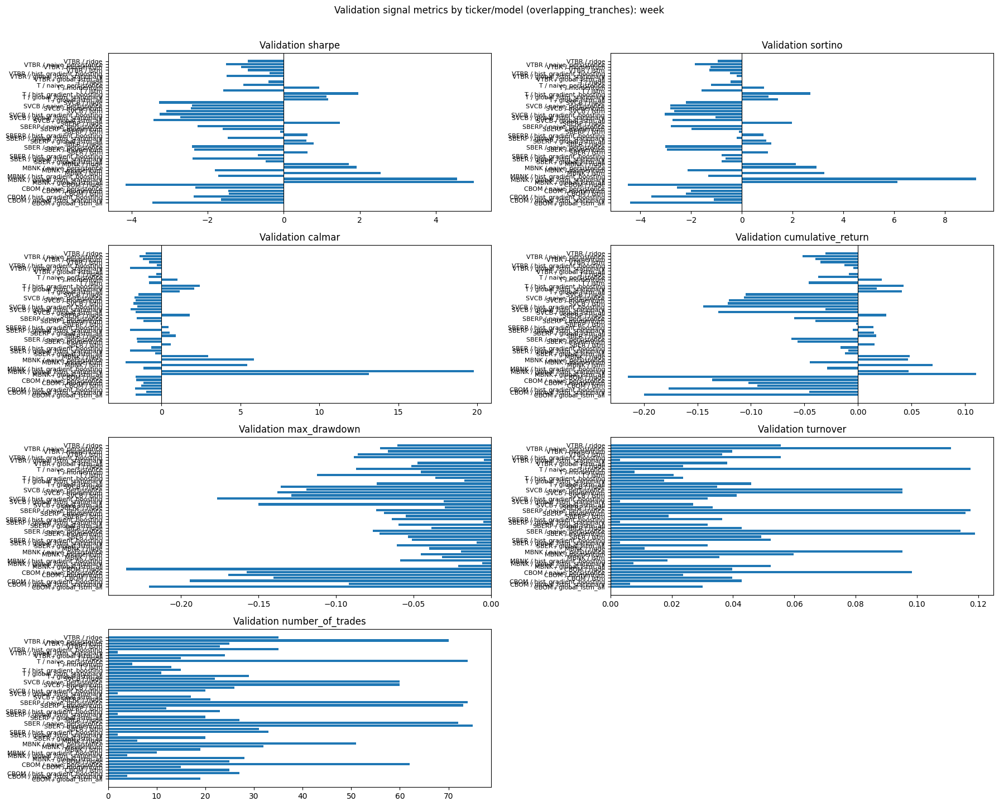

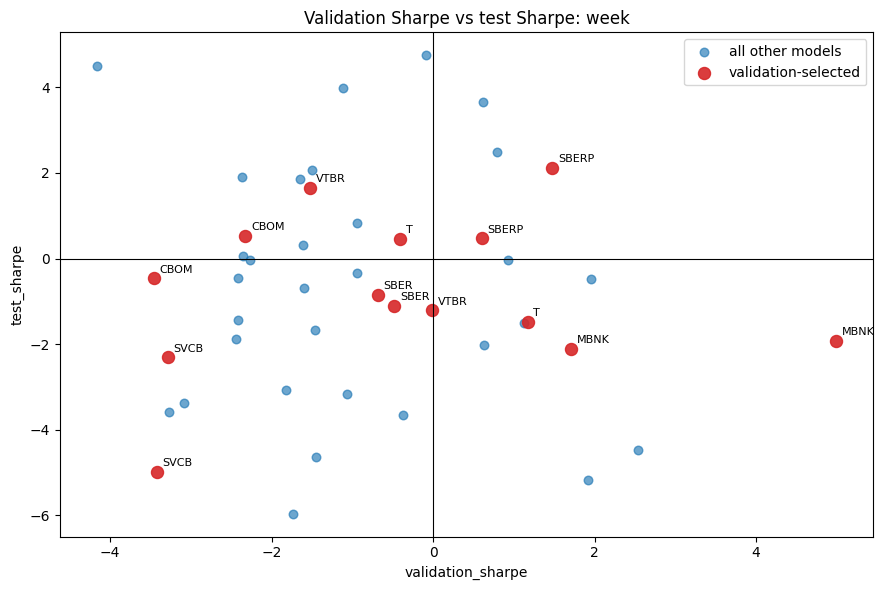

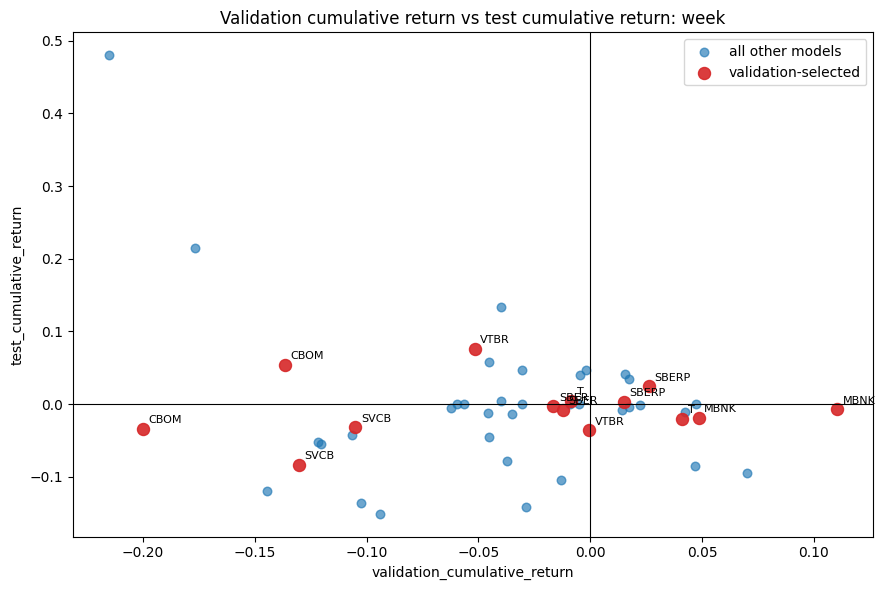

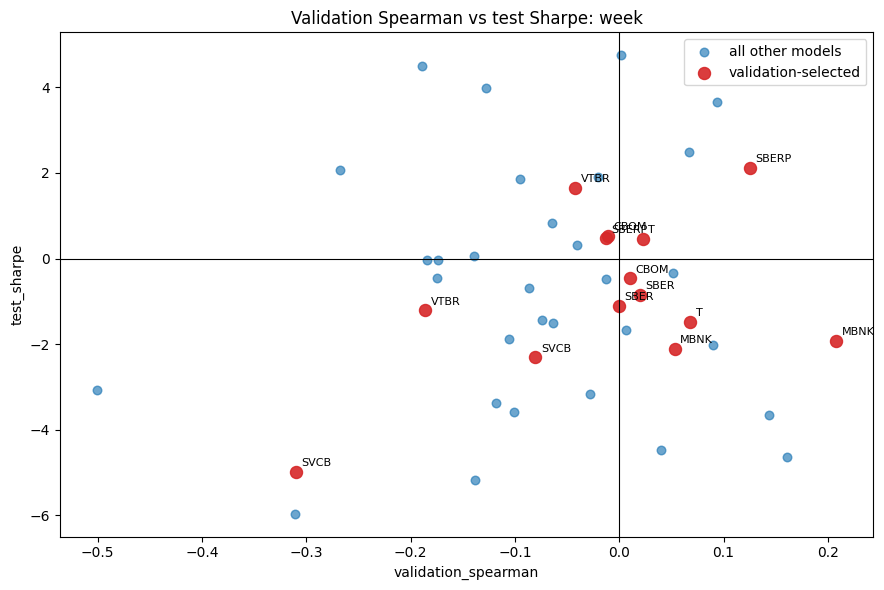

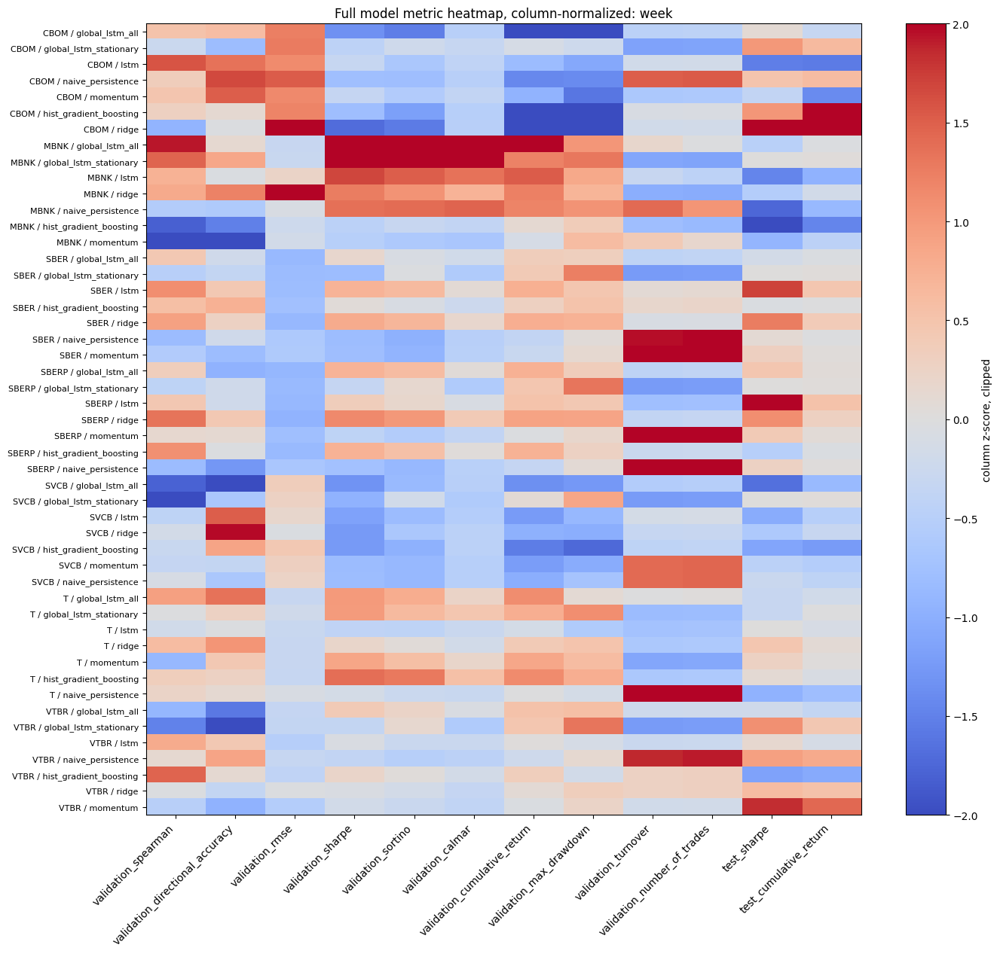

...

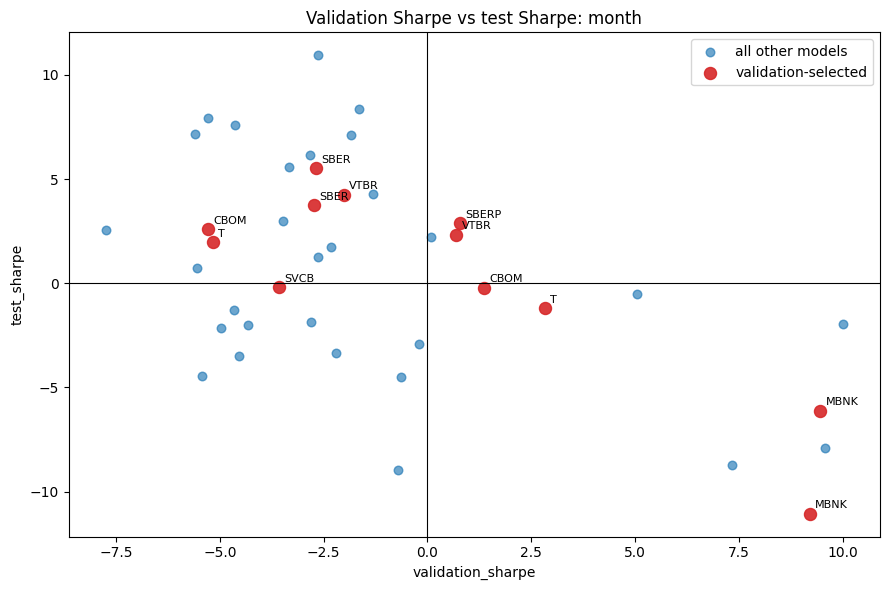

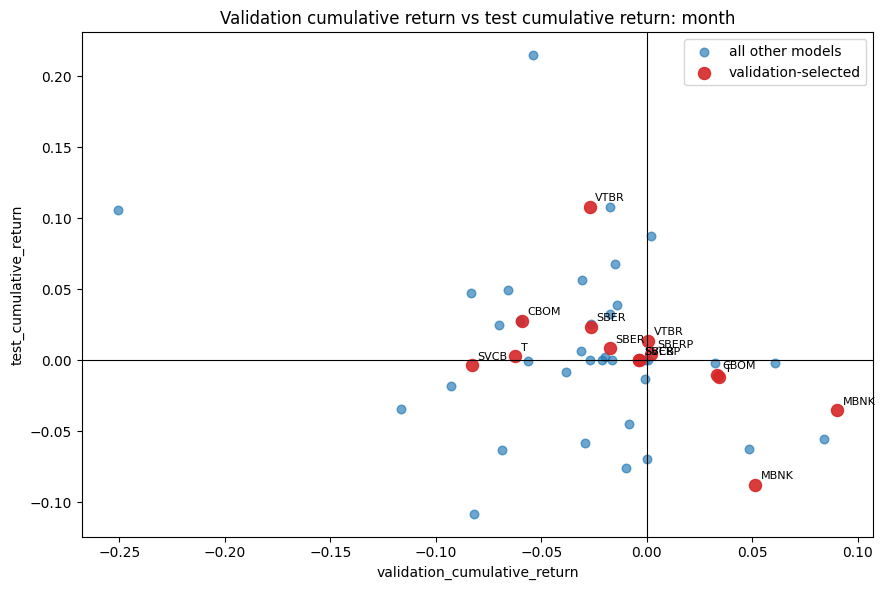

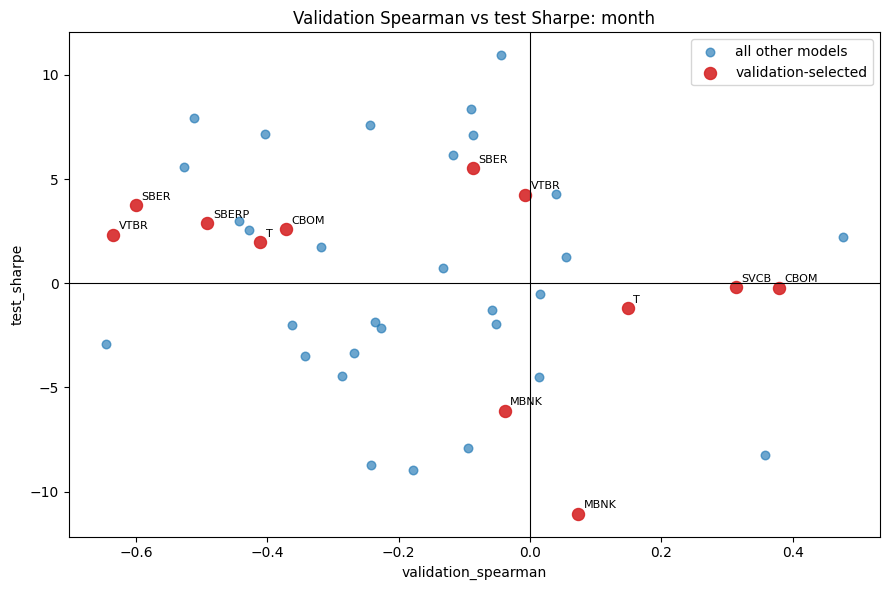

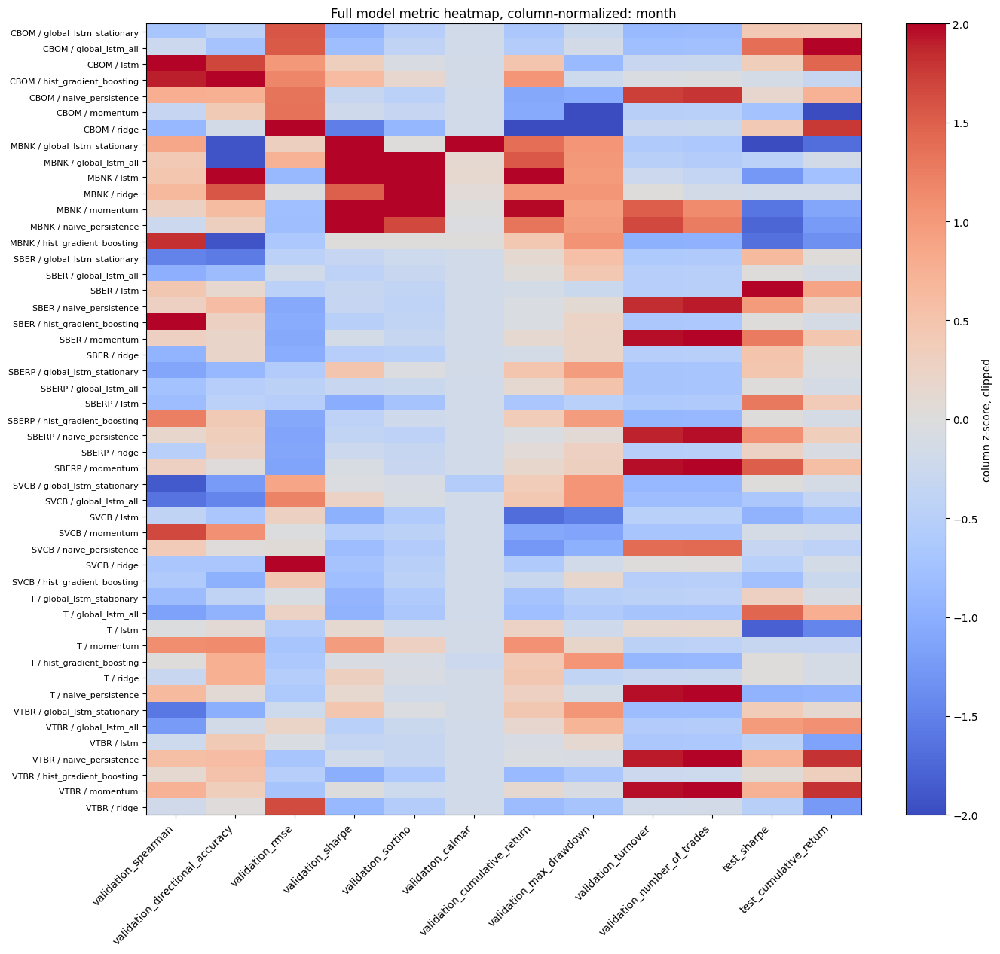

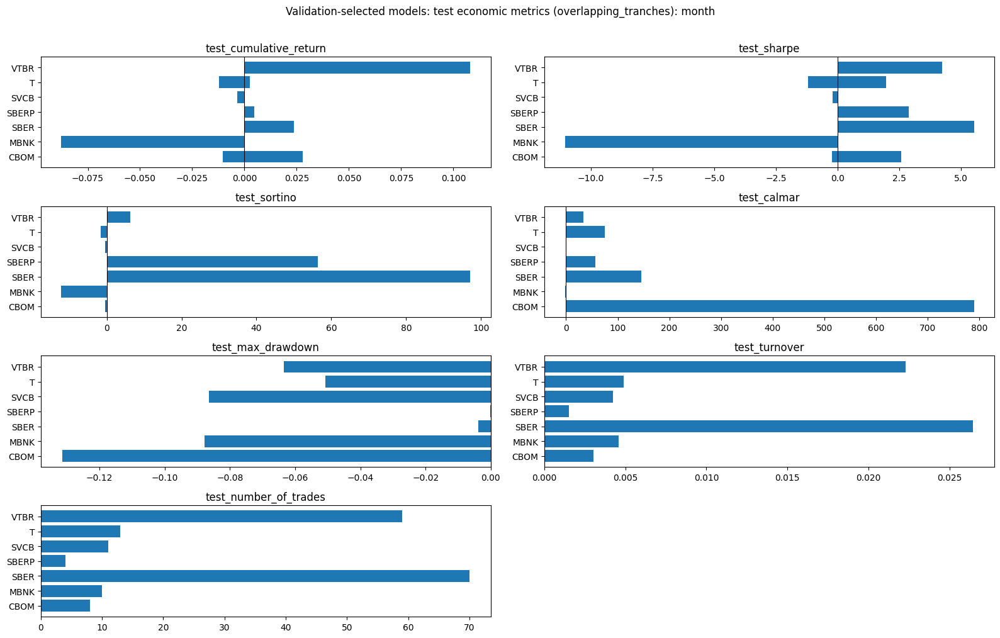

In [7]:
def plot_validation_signal_metric_bars(horizon_name: str, result: dict) -> None:
    validation_signal = headline_signal_metrics(result["validation_signal_metrics"])
    plot_cols = [col for col in VALIDATION_BAR_METRIC_COLS if col in validation_signal.columns]
    if validation_signal.empty or not plot_cols:
        return

    plot_data = validation_signal.sort_values(["ticker", "model_name"]).copy()
    plot_data["ticker_model"] = plot_data["ticker"].astype(str) + " / " + plot_data["model_name"].astype(str)
    ncols = 2
    nrows = int(np.ceil(len(plot_cols) / ncols))
    fig_height = max(10, 2 + len(plot_data) * 0.25)
    fig, axes = plt.subplots(nrows, ncols, figsize=(18, fig_height), squeeze=False)
    for ax in axes.ravel():
        ax.set_visible(False)
    for ax, col in zip(axes.ravel(), plot_cols):
        ax.set_visible(True)
        ax.barh(plot_data["ticker_model"], plot_data[col])
        ax.axvline(0, color="black", linewidth=0.8)
        ax.set_title(f"Validation {col}")
        ax.tick_params(axis="y", labelsize=8)
    fig.suptitle(f"Validation signal metrics by ticker/model ({HEADLINE_SIGNAL_MODE}): {horizon_name}", y=1.01)
    fig.tight_layout()
    fig.savefig(result["summary_plots_dir"] / "validation_signal_metrics_by_ticker_model.png", dpi=150, bbox_inches="tight")
    plt.show()


def plot_metric_scatter(result: dict, x_col: str, y_col: str, title: str, filename: str) -> None:
    comparison = result["validation_model_metric_comparison"]
    if x_col not in comparison.columns or y_col not in comparison.columns:
        return
    plot_data = comparison[["ticker", "model_name", "is_validation_selected", x_col, y_col]].replace([np.inf, -np.inf], np.nan).dropna(subset=[x_col, y_col])
    if plot_data.empty:
        return

    selected = plot_data[plot_data["is_validation_selected"].fillna(False).astype(bool)]
    other = plot_data.drop(selected.index)
    fig, ax = plt.subplots(figsize=(9, 6))
    ax.scatter(other[x_col], other[y_col], s=38, alpha=0.65, label="all other models")
    if not selected.empty:
        ax.scatter(selected[x_col], selected[y_col], s=75, alpha=0.9, label="validation-selected", color="tab:red")
        for _, row in selected.iterrows():
            ax.annotate(str(row["ticker"]), (row[x_col], row[y_col]), fontsize=8, xytext=(4, 4), textcoords="offset points")
    ax.axhline(0, color="black", linewidth=0.8)
    ax.axvline(0, color="black", linewidth=0.8)
    ax.set_xlabel(x_col)
    ax.set_ylabel(y_col)
    ax.set_title(title)
    ax.legend()
    fig.tight_layout()
    fig.savefig(result["summary_plots_dir"] / filename, dpi=150, bbox_inches="tight")
    plt.show()


def plot_full_metric_heatmap(horizon_name: str, result: dict) -> None:
    comparison = result["validation_model_metric_comparison"].copy()
    heatmap_cols = [
        "validation_spearman",
        "validation_directional_accuracy",
        "validation_rmse",
        "validation_sharpe",
        "validation_sortino",
        "validation_calmar",
        "validation_cumulative_return",
        "validation_max_drawdown",
        "validation_turnover",
        "validation_number_of_trades",
        "test_sharpe",
        "test_cumulative_return",
    ]
    heatmap_cols = [col for col in heatmap_cols if col in comparison.columns]
    if comparison.empty or not heatmap_cols:
        return

    heatmap = comparison.set_index("ticker_model")[heatmap_cols].replace([np.inf, -np.inf], np.nan)
    normalized = (heatmap - heatmap.mean()) / heatmap.std(ddof=0).replace(0, np.nan)
    normalized = normalized.fillna(0.0).clip(-2.0, 2.0)
    fig_height = max(8, 2 + len(heatmap) * 0.22)
    fig, ax = plt.subplots(figsize=(14, fig_height))
    image = ax.imshow(normalized.to_numpy(), aspect="auto", cmap="coolwarm", vmin=-2, vmax=2)
    ax.set_xticks(np.arange(len(heatmap_cols)))
    ax.set_xticklabels(heatmap_cols, rotation=45, ha="right")
    ax.set_yticks(np.arange(len(heatmap.index)))
    ax.set_yticklabels(heatmap.index, fontsize=8)
    ax.set_title(f"Full model metric heatmap, column-normalized: {horizon_name}")
    fig.colorbar(image, ax=ax, label="column z-score, clipped")
    fig.tight_layout()
    fig.savefig(result["summary_plots_dir"] / "validation_test_metric_heatmap.png", dpi=150, bbox_inches="tight")
    plt.show()


def plot_selected_test_metric_bars(horizon_name: str, result: dict) -> None:
    comparison = result["validation_model_metric_comparison"]
    if "is_validation_selected" not in comparison.columns:
        return
    selected = comparison[comparison["is_validation_selected"].fillna(False).astype(bool)].sort_values("ticker")
    plot_cols = [col for col in ["test_cumulative_return", "test_sharpe", "test_sortino", "test_calmar", "test_max_drawdown", "test_turnover", "test_number_of_trades"] if col in selected.columns]
    if selected.empty or not plot_cols:
        return

    ncols = 2
    nrows = int(np.ceil(len(plot_cols) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(16, 10), squeeze=False)
    for ax in axes.ravel():
        ax.set_visible(False)
    for ax, col in zip(axes.ravel(), plot_cols):
        ax.set_visible(True)
        ax.barh(selected["ticker"].astype(str), selected[col])
        ax.axvline(0, color="black", linewidth=0.8)
        ax.set_title(col)
    fig.suptitle(f"Validation-selected models: test economic metrics ({HEADLINE_SIGNAL_MODE}): {horizon_name}", y=1.01)
    fig.tight_layout()
    fig.savefig(result["summary_plots_dir"] / "selected_models_test_economic_metrics.png", dpi=150, bbox_inches="tight")
    plt.show()


for horizon_name, result in horizon_results.items():
    plot_validation_signal_metric_bars(horizon_name, result)
    plot_metric_scatter(result, "validation_sharpe", "test_sharpe", f"Validation Sharpe vs test Sharpe: {horizon_name}", "validation_sharpe_vs_test_sharpe.png")
    plot_metric_scatter(result, "validation_cumulative_return", "test_cumulative_return", f"Validation cumulative return vs test cumulative return: {horizon_name}", "validation_cumulative_return_vs_test_cumulative_return.png")
    plot_metric_scatter(result, "validation_spearman", "test_sharpe", f"Validation Spearman vs test Sharpe: {horizon_name}", "validation_spearman_vs_test_sharpe.png")
    plot_full_metric_heatmap(horizon_name, result)
    plot_selected_test_metric_bars(horizon_name, result)


## Test Prediction Metrics

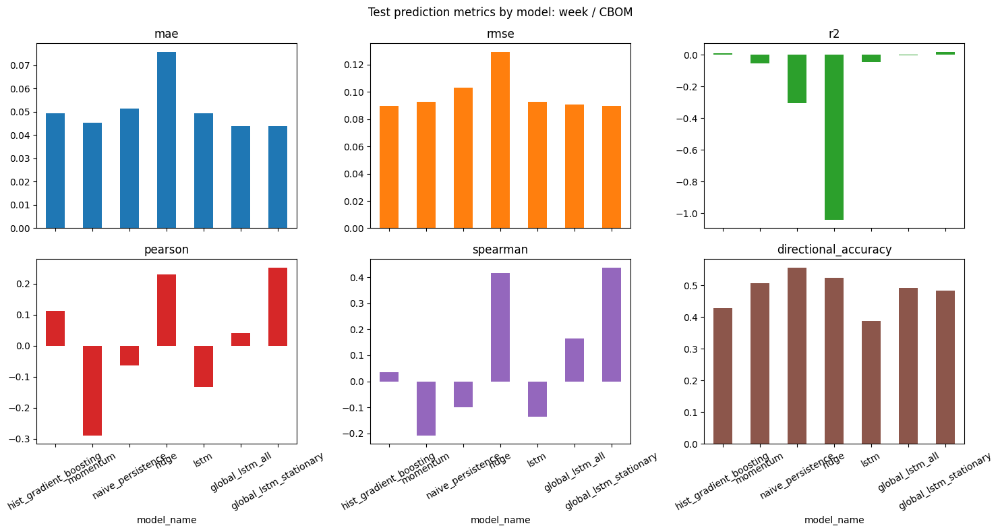

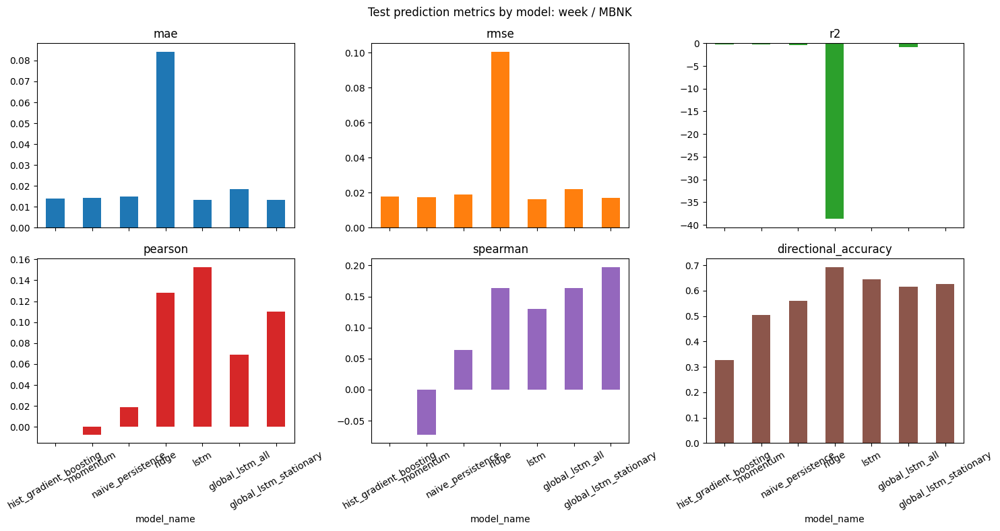

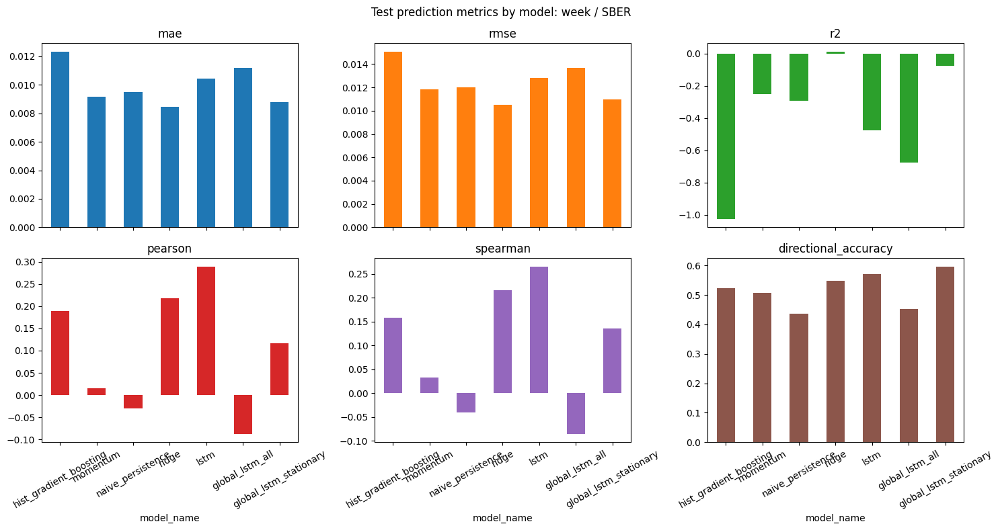

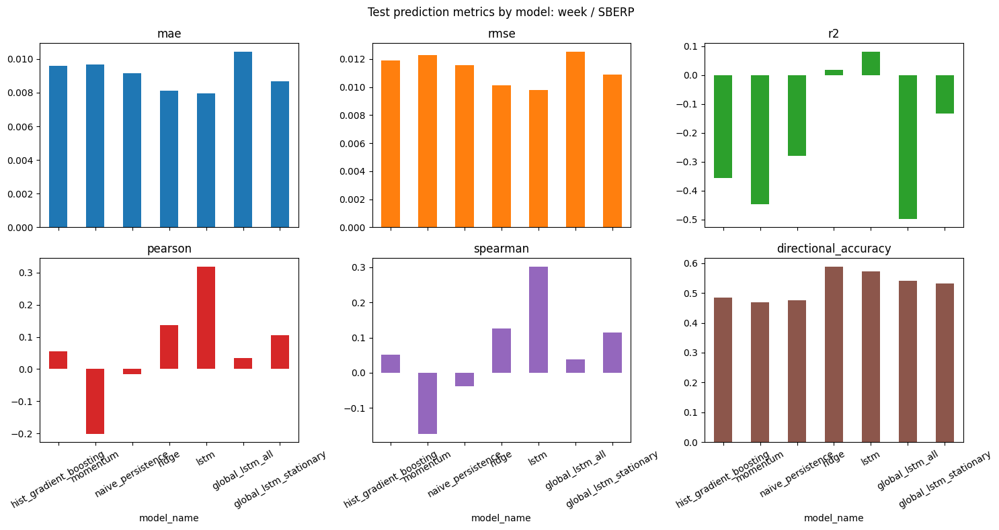

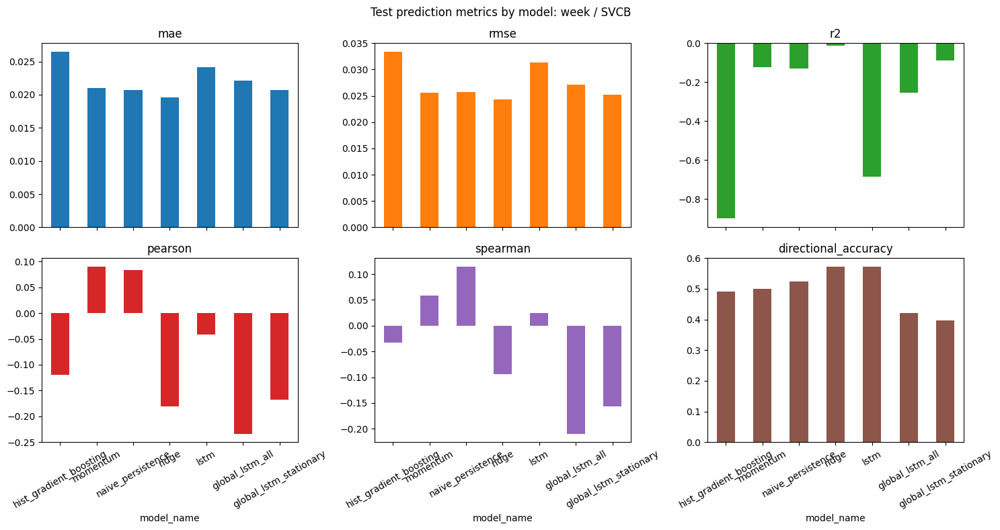

...

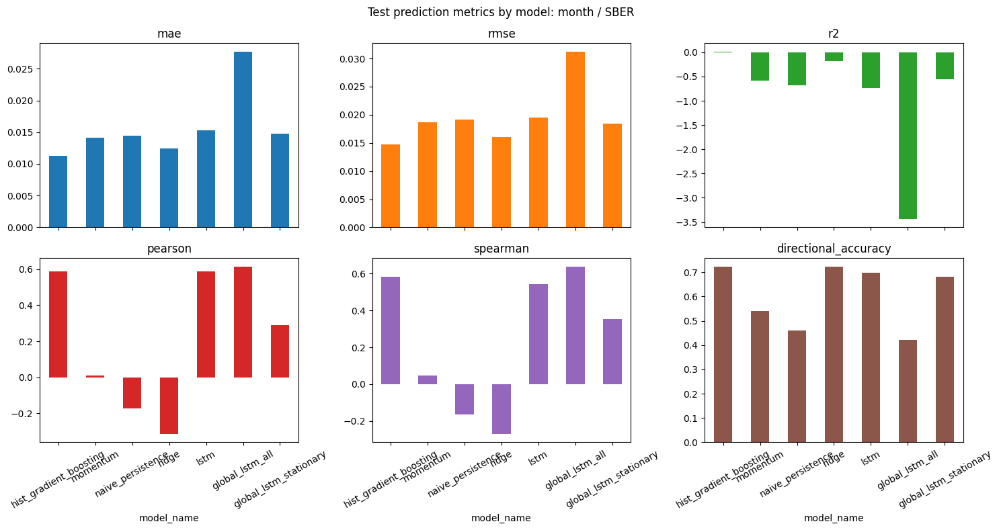

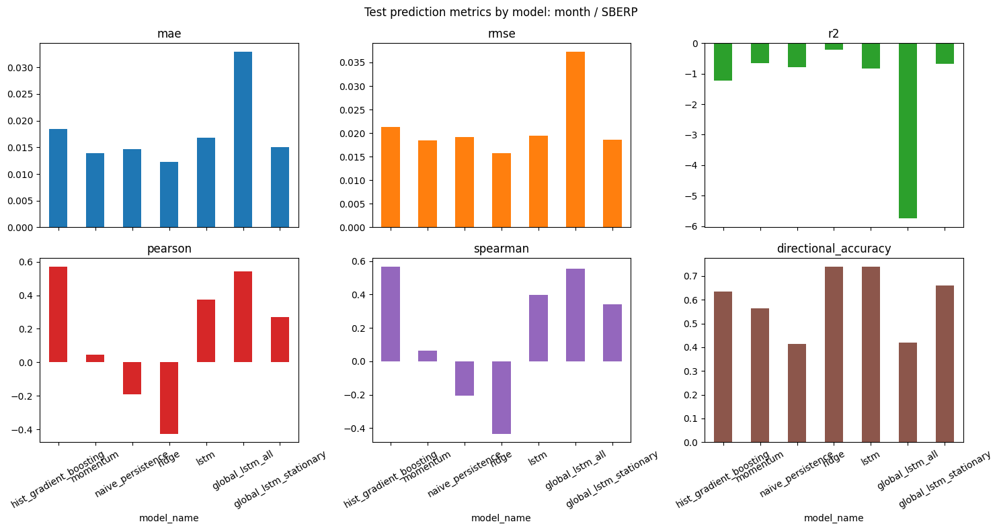

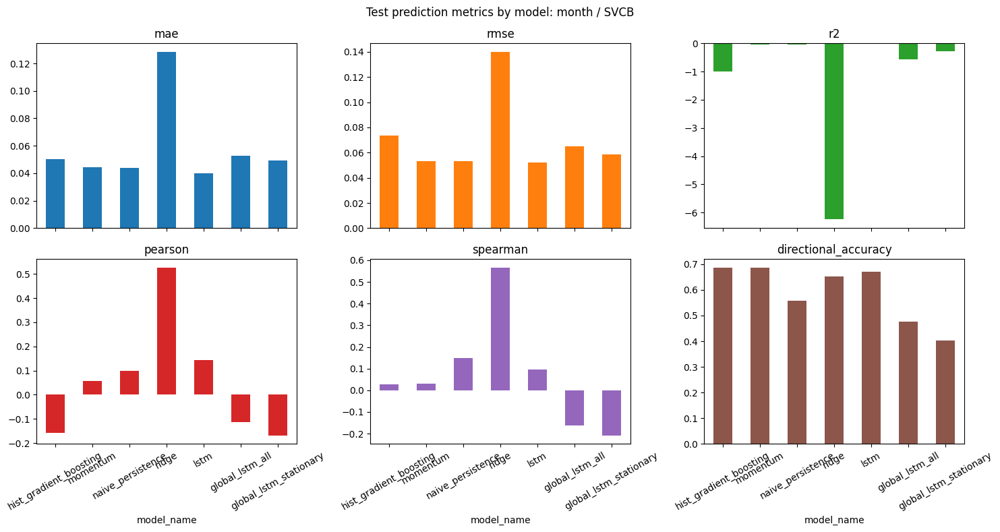

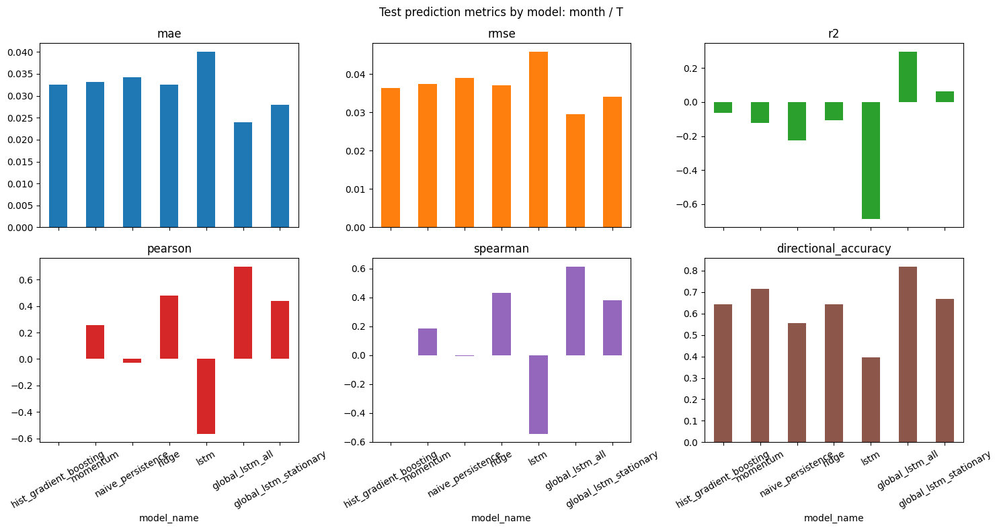

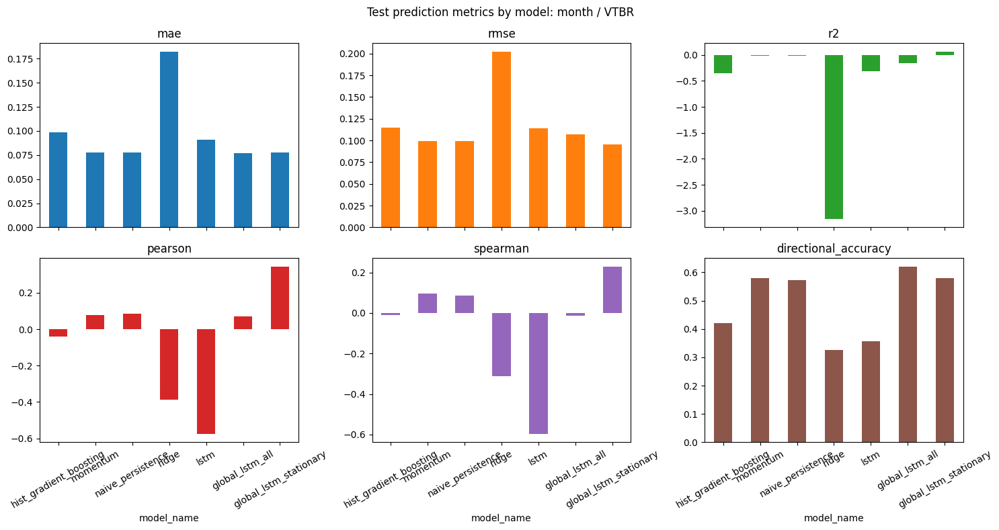

In [8]:
for horizon_name, result in horizon_results.items():
    metrics = result["test_prediction_metrics"]
    ticker_plots_dir = result["ticker_plots_dir"]

    for ticker in result["plot_tickers"]:
        ticker_metrics = metrics[metrics["ticker"].astype(str) == ticker]
        plot_cols = [col for col in PREDICTION_METRIC_COLS if col in ticker_metrics.columns]
        if ticker_metrics.empty or not plot_cols:
            continue
        plot_data = ticker_metrics.set_index("model_name")[plot_cols]
        axes = plot_data.plot(
            kind="bar",
            subplots=True,
            layout=(2, 3),
            figsize=(15, 8),
            legend=False,
            title=f"Test prediction metrics by model: {horizon_name} / {ticker}",
        )
        for ax in axes.ravel():
            ax.tick_params(axis="x", rotation=30)
        fig = axes[0][0].get_figure()
        fig.tight_layout()
        fig.savefig(ticker_plots_dir / f"{safe_filename(ticker)}_test_prediction_metrics.png", dpi=150, bbox_inches="tight")
        plt.show()


## Test Predicted Vs Actual And Distributions For Each Ticker


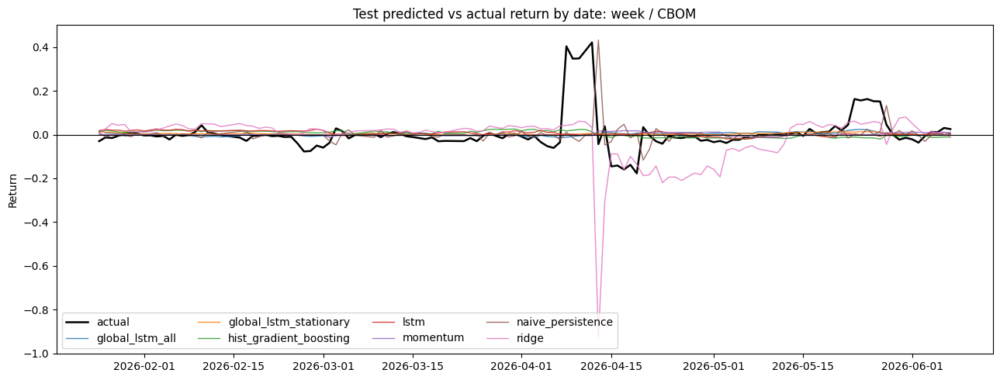

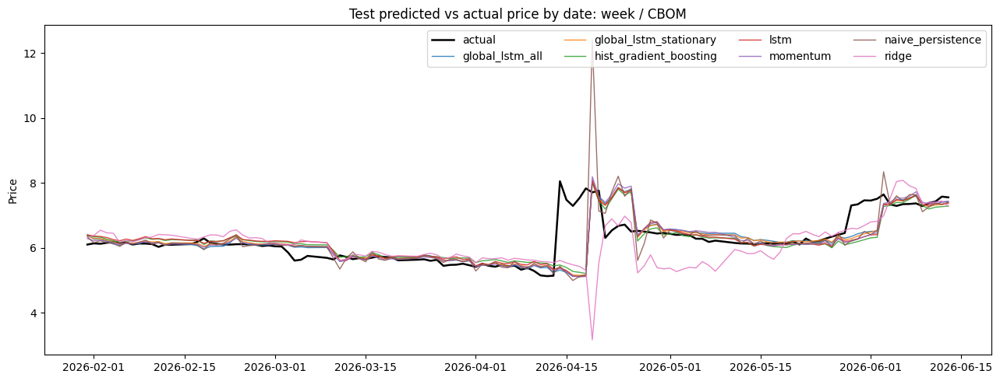

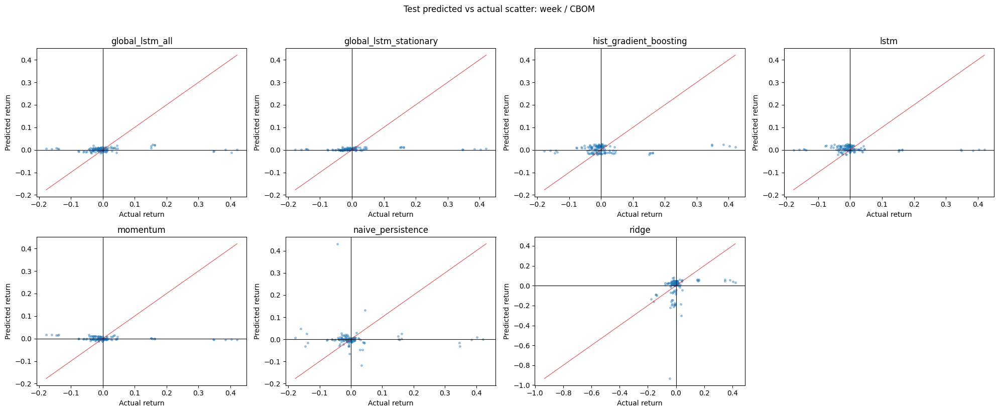

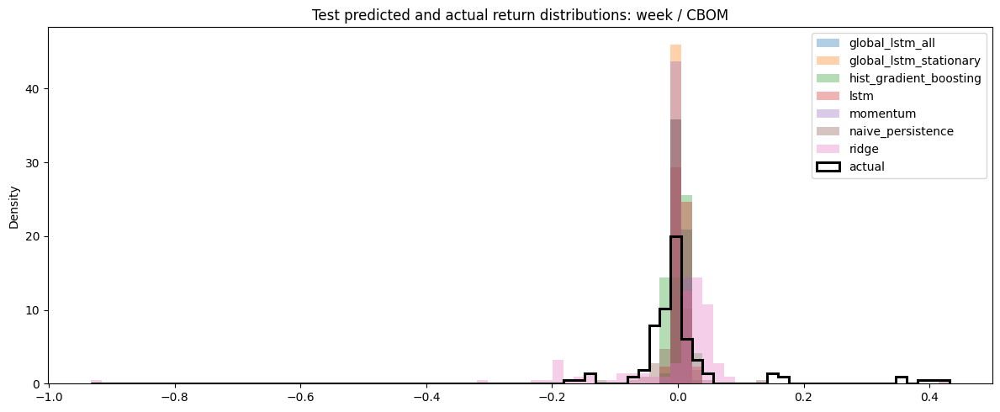

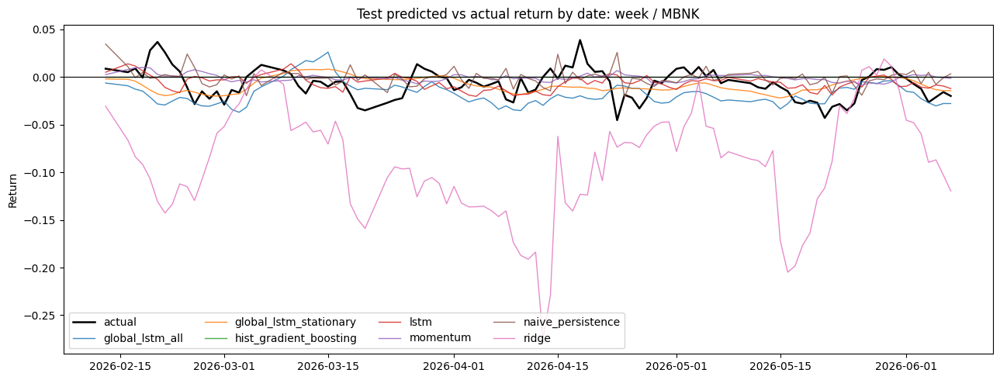

...

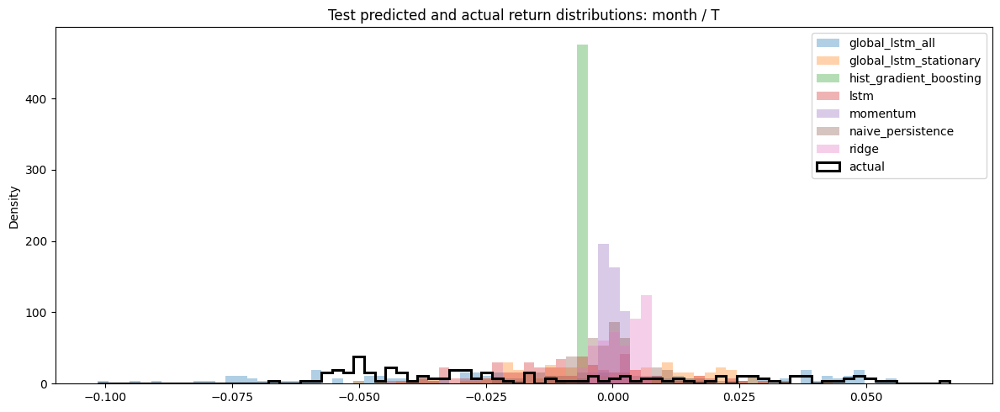

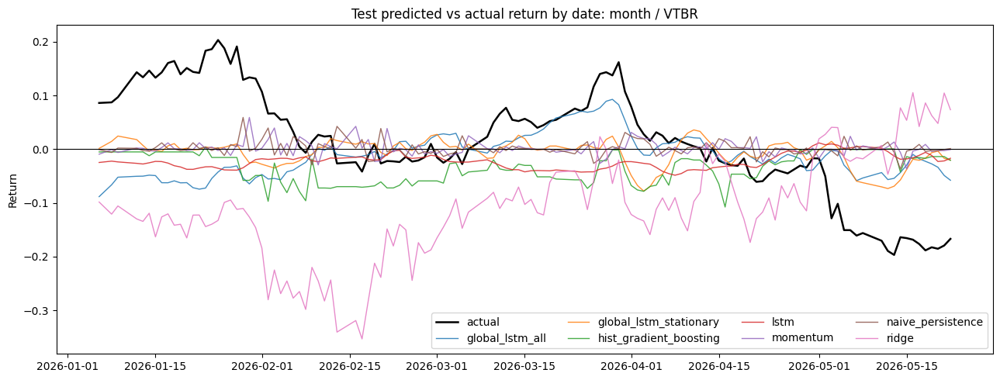

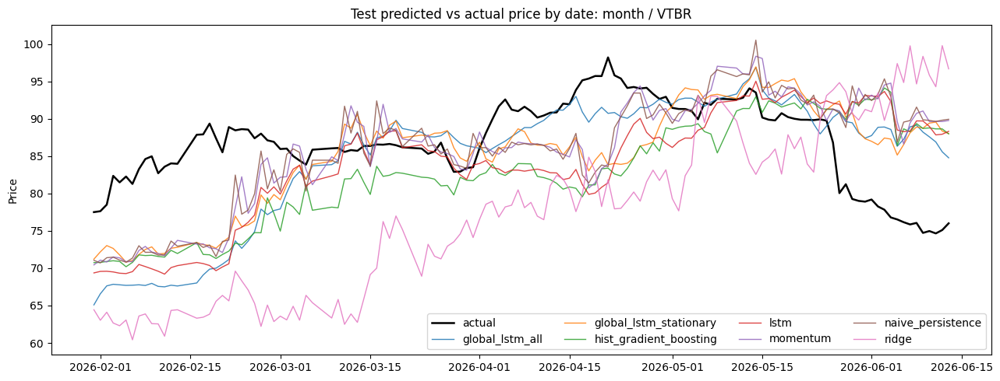

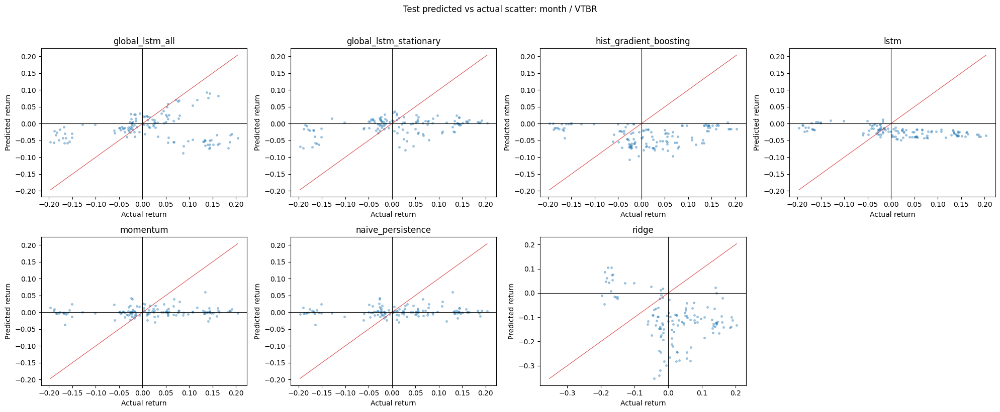

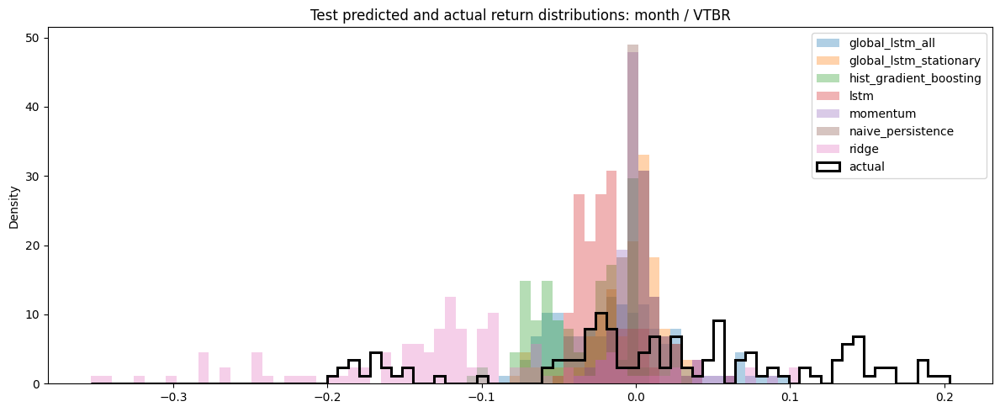

In [9]:
for horizon_name, result in horizon_results.items():
    test_predictions = result["test_predictions"]
    ticker_plots_dir = result["ticker_plots_dir"]
    models = sorted(test_predictions["model_name"].dropna().astype(str).unique())

    for ticker in result["plot_tickers"]:
        ticker_predictions = test_predictions[test_predictions["ticker"].astype(str) == ticker].sort_values("date")
        if ticker_predictions.empty:
            continue
        safe_ticker = safe_filename(ticker)

        actual = ticker_predictions.drop_duplicates(["date", "ticker"]).sort_values("date")
        fig, ax = plt.subplots(figsize=(13, 5))
        ax.plot(actual["date"], actual["y_true"], color="black", linewidth=1.8, label="actual")
        for model_name, group in ticker_predictions.groupby("model_name", sort=True):
            ax.plot(group["date"], group["y_pred"], linewidth=1.0, alpha=0.85, label=str(model_name))
        ax.axhline(0, color="black", linewidth=0.8)
        ax.set_title(f"Test predicted vs actual return by date: {horizon_name} / {ticker}")
        ax.set_ylabel("Return")
        ax.legend(ncol=min(ticker_predictions["model_name"].nunique() + 1, 4))
        fig.tight_layout()
        fig.savefig(ticker_plots_dir / f"{safe_ticker}_test_predicted_vs_actual_by_date.png", dpi=150, bbox_inches="tight")
        plt.show()

        price_required_cols = {"target_date", "entry_open", "future_open", "y_pred", "model_name"}
        missing_price_cols = sorted(price_required_cols - set(ticker_predictions.columns))
        if missing_price_cols:
            print(f"Skipping price plot for {horizon_name} / {ticker}; missing columns: {missing_price_cols}")
        else:
            actual_price = ticker_predictions.drop_duplicates(["target_date", "ticker"]).sort_values("target_date")
            actual_price = actual_price.dropna(subset=["target_date", "future_open"])
            fig, ax = plt.subplots(figsize=(13, 5))
            ax.plot(actual_price["target_date"], actual_price["future_open"], color="black", linewidth=1.8, label="actual")
            plotted_price_models = 0
            for model_name, group in ticker_predictions.groupby("model_name", sort=True):
                price_group = group.dropna(subset=["target_date", "entry_open", "y_pred"]).sort_values("target_date")
                if price_group.empty:
                    continue
                predicted_price = price_group["entry_open"].astype(float) * np.exp(price_group["y_pred"].astype(float))
                ax.plot(price_group["target_date"], predicted_price, linewidth=1.0, alpha=0.85, label=str(model_name))
                plotted_price_models += 1
            if actual_price.empty and plotted_price_models == 0:
                print(f"Skipping price plot for {horizon_name} / {ticker}; no valid price rows")
                plt.close(fig)
            else:
                ax.set_title(f"Test predicted vs actual price by date: {horizon_name} / {ticker}")
                ax.set_ylabel("Price")
                ax.legend(ncol=min(plotted_price_models + 1, 4))
                fig.tight_layout()
                fig.savefig(ticker_plots_dir / f"{safe_ticker}_test_predicted_vs_actual_price_by_date.png", dpi=150, bbox_inches="tight")
                plt.show()

        n_models = max(len(models), 1)
        ncols = min(n_models, 4)
        nrows = int(np.ceil(n_models / ncols))
        fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4 * nrows), squeeze=False)
        for ax in axes.ravel():
            ax.set_visible(False)
        for ax, model_name in zip(axes.ravel(), models):
            ax.set_visible(True)
            part = ticker_predictions[ticker_predictions["model_name"].astype(str) == model_name]
            part = part[["y_true", "y_pred"]].dropna()
            if len(part) > SCATTER_SAMPLE:
                part = part.sample(SCATTER_SAMPLE, random_state=42)
            ax.scatter(part["y_true"], part["y_pred"], s=7, alpha=0.35)
            if not part.empty:
                lo = float(np.nanmin([part["y_true"].min(), part["y_pred"].min()]))
                hi = float(np.nanmax([part["y_true"].max(), part["y_pred"].max()]))
                ax.plot([lo, hi], [lo, hi], color="tab:red", linewidth=0.9, alpha=0.75, label="y = x")
            ax.axhline(0, color="black", linewidth=0.8)
            ax.axvline(0, color="black", linewidth=0.8)
            ax.set_title(str(model_name))
            ax.set_xlabel("Actual return")
            ax.set_ylabel("Predicted return")
        fig.suptitle(f"Test predicted vs actual scatter: {horizon_name} / {ticker}", y=1.02)
        fig.tight_layout()
        fig.savefig(ticker_plots_dir / f"{safe_ticker}_test_predicted_vs_actual_scatter.png", dpi=150, bbox_inches="tight")
        plt.show()

        actual_returns = actual["y_true"].dropna()
        predicted_returns = ticker_predictions["y_pred"].dropna()
        combined_returns = pd.concat([predicted_returns, actual_returns], ignore_index=True)
        if combined_returns.empty:
            continue
        distribution_bins = np.histogram_bin_edges(combined_returns, bins=80)
        fig, ax = plt.subplots(figsize=(12, 5))
        for model_name, group in ticker_predictions.groupby("model_name", sort=True):
            group["y_pred"].dropna().plot(
                kind="hist",
                bins=distribution_bins,
                alpha=0.35,
                ax=ax,
                label=str(model_name),
                density=True,
            )
        ax.hist(actual_returns, bins=distribution_bins, density=True, histtype="step", linewidth=2.2, color="black", label="actual")
        ax.set_title(f"Test predicted and actual return distributions: {horizon_name} / {ticker}")
        ax.set_ylabel("Density")
        ax.legend()
        fig.tight_layout()
        fig.savefig(ticker_plots_dir / f"{safe_ticker}_test_prediction_distribution.png", dpi=150, bbox_inches="tight")
        plt.show()


## Test Signal Equity And Metrics

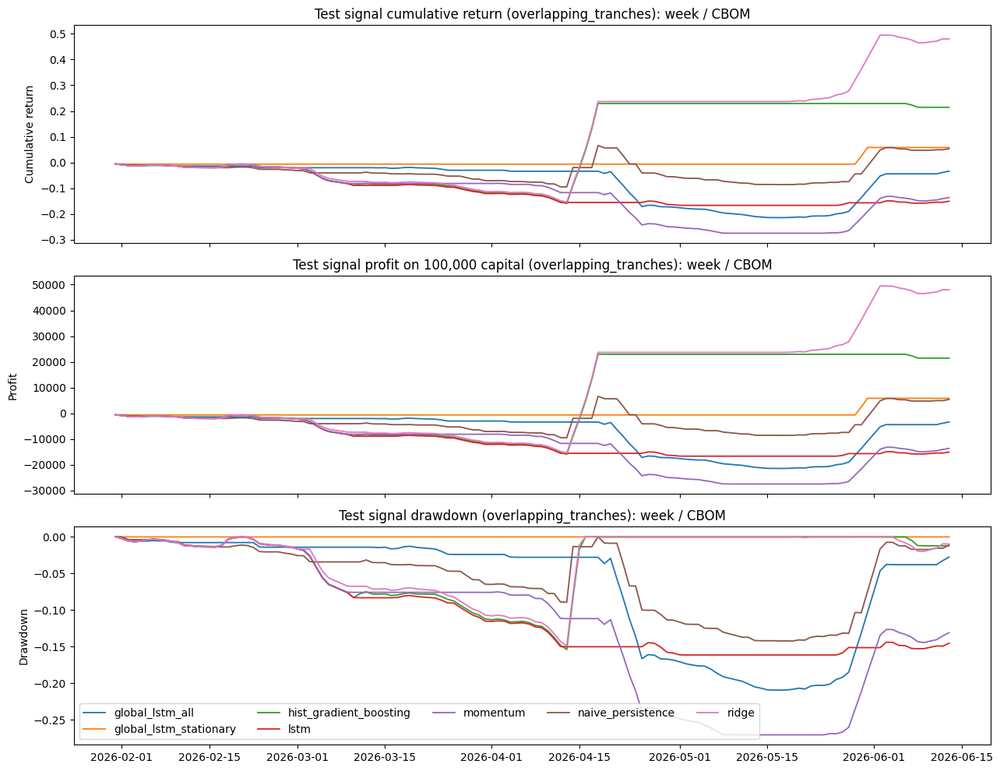

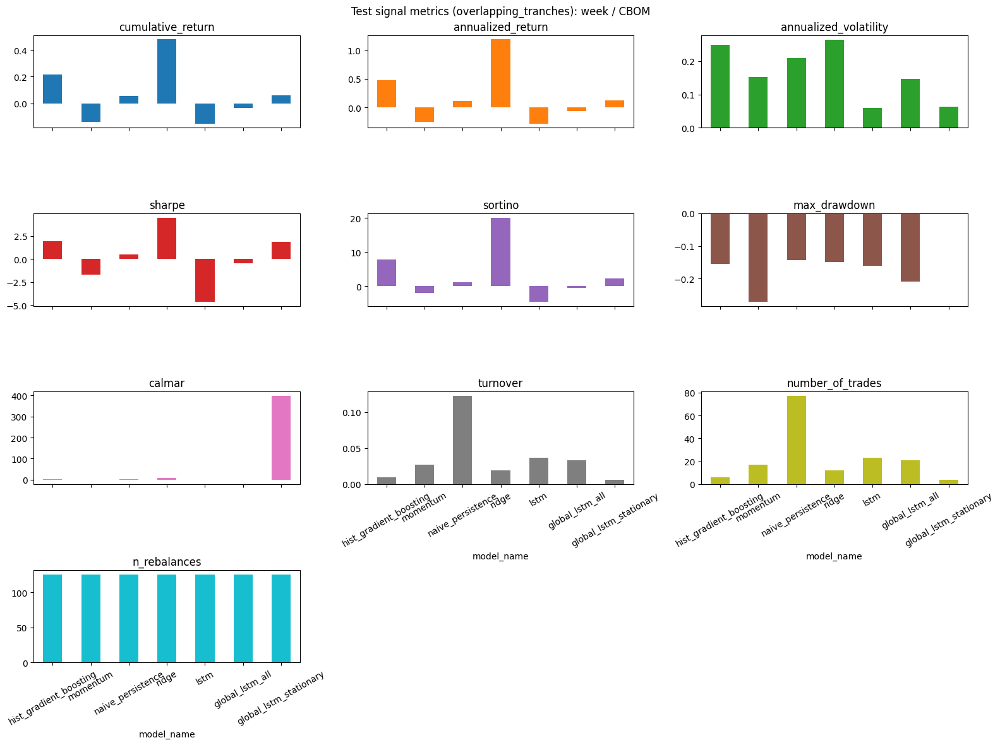

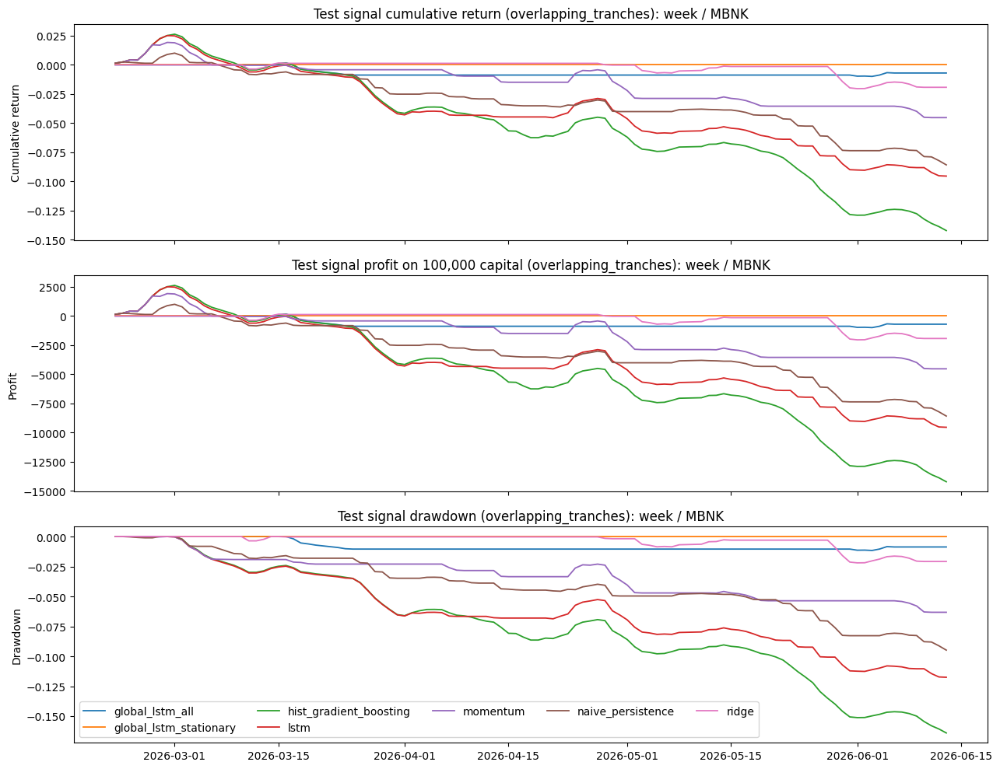

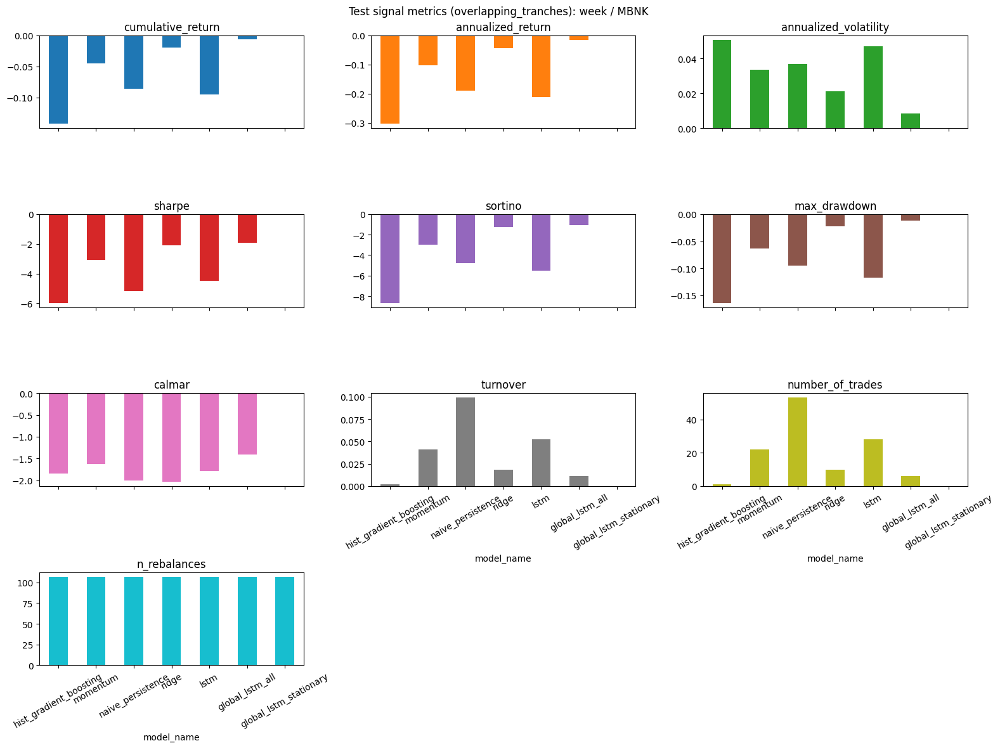

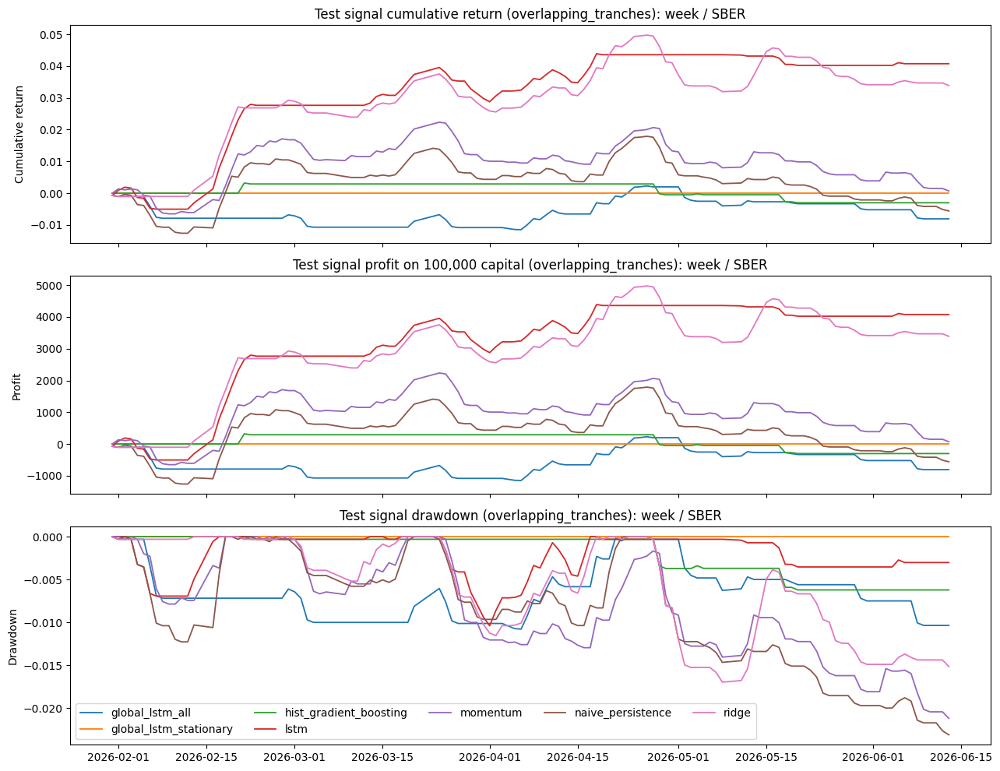

...

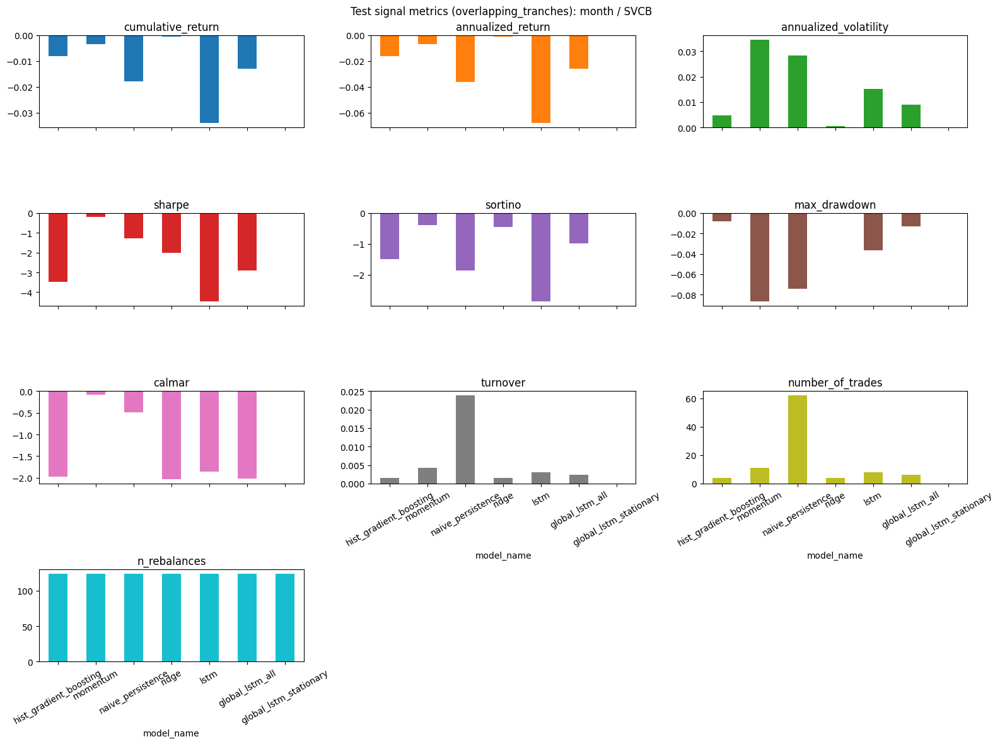

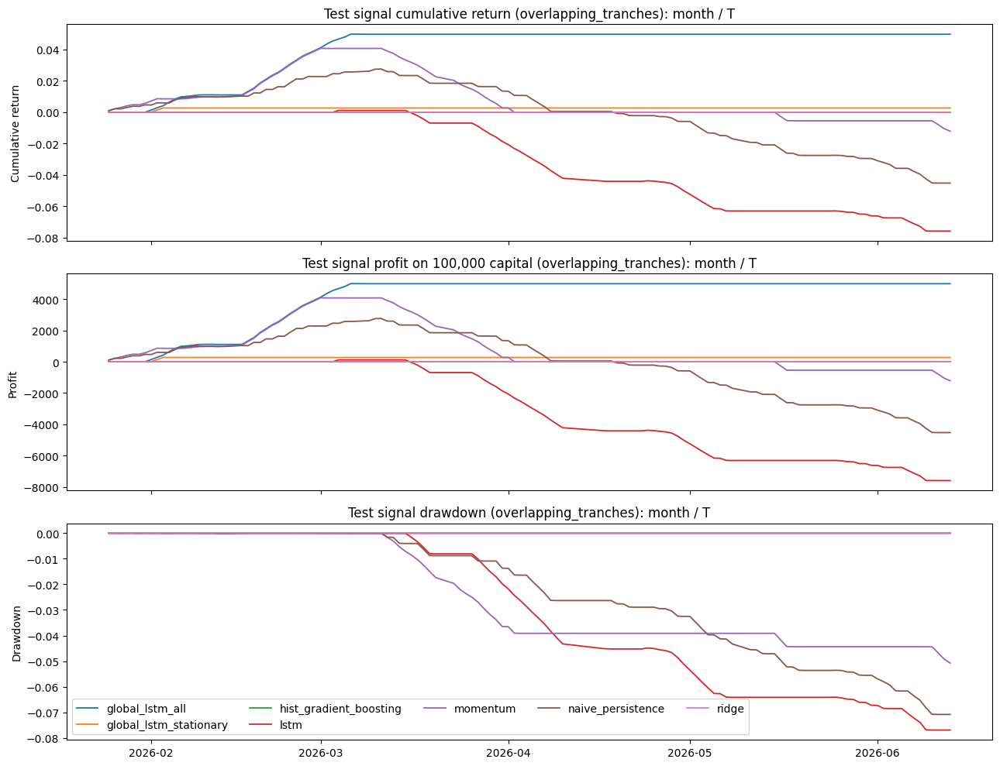

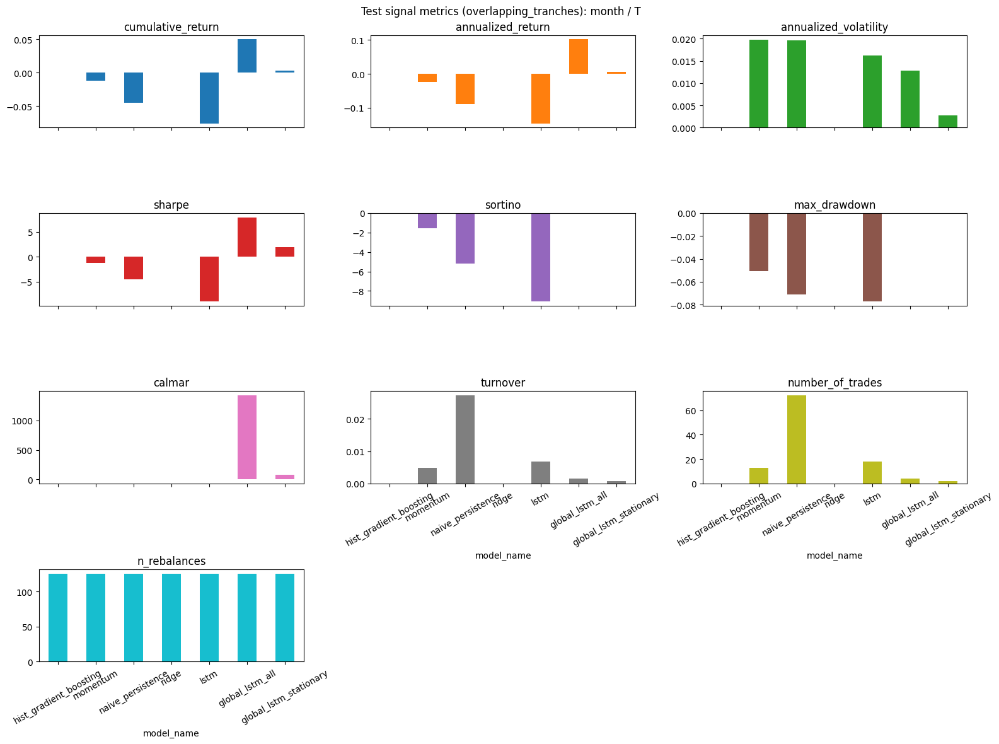

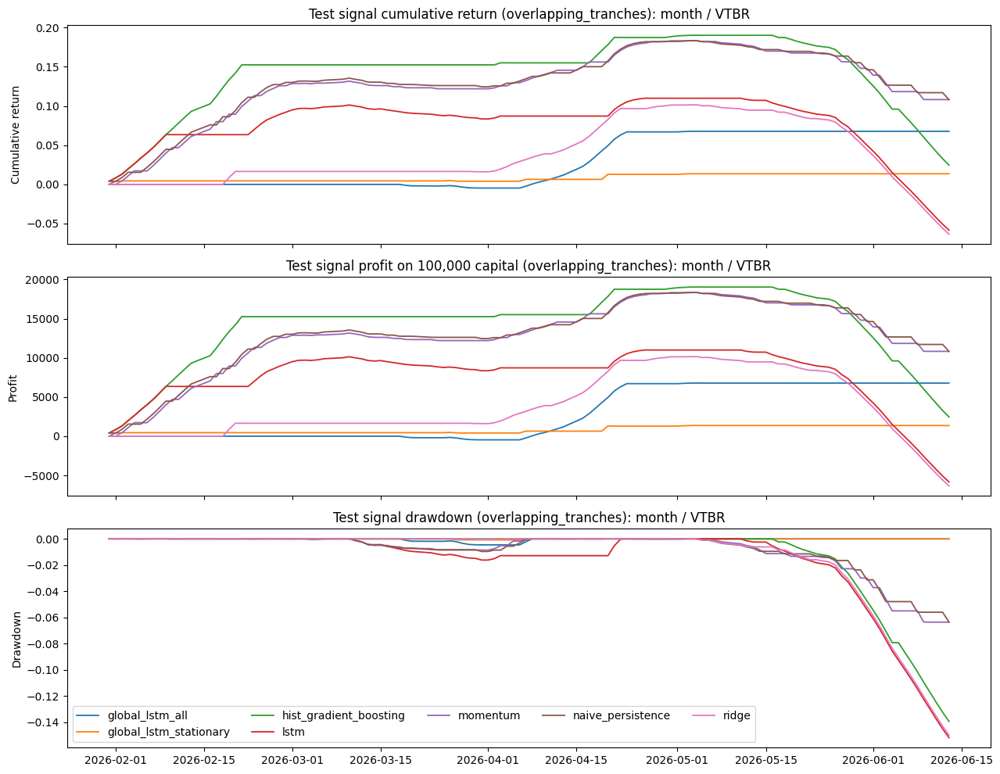

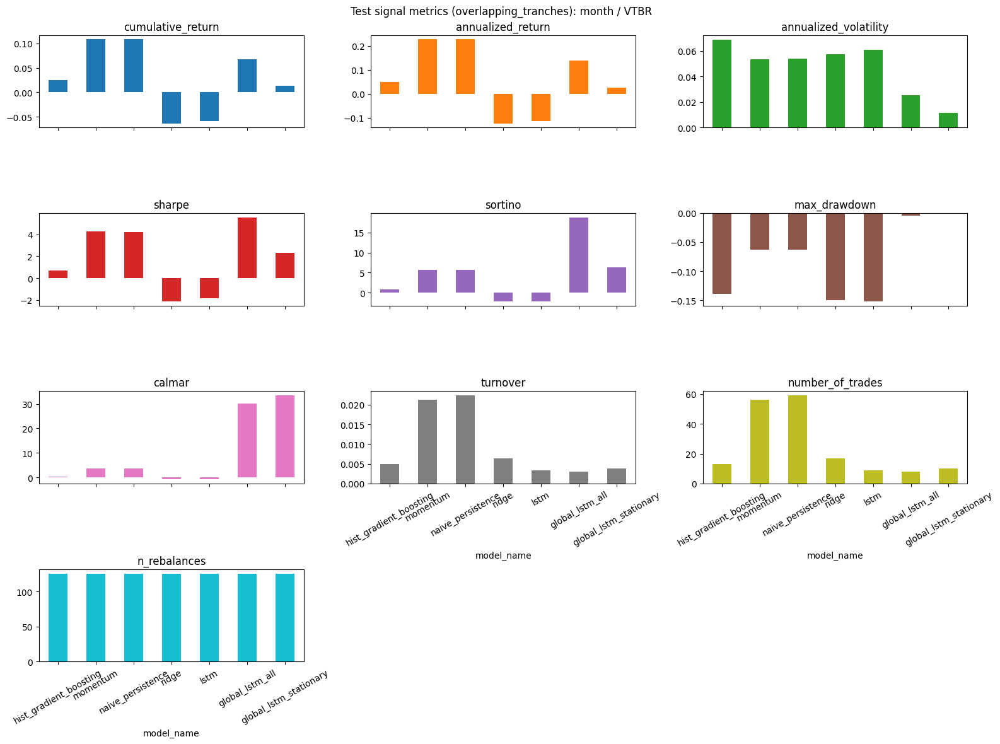

In [10]:
for horizon_name, result in horizon_results.items():
    equity = result["test_signal_equity"]
    signal_metrics = result["test_signal_metrics"]
    ticker_plots_dir = result["ticker_plots_dir"]

    headline_equity = equity[equity["signal_mode"] == HEADLINE_SIGNAL_MODE].copy()
    headline_metrics = signal_metrics[signal_metrics["signal_mode"] == HEADLINE_SIGNAL_MODE].copy()
    if headline_equity.empty:
        print(f"No test signal equity data for {horizon_name}")
        continue

    for ticker in result["plot_tickers"]:
        safe_ticker = safe_filename(ticker)
        ticker_equity = headline_equity[headline_equity["ticker"].astype(str) == ticker].sort_values("date")
        ticker_signal_metrics = headline_metrics[headline_metrics["ticker"].astype(str) == ticker]
        if ticker_equity.empty:
            continue

        fig, axes = plt.subplots(3, 1, figsize=(13, 10), sharex=True)
        for model_name, group in ticker_equity.groupby("model_name"):
            axes[0].plot(group["date"], group["cumulative_return"], label=model_name, linewidth=1.3)
            axes[1].plot(group["date"], group["cumulative_return"].astype(float) * PROFIT_INITIAL_CAPITAL, label=model_name, linewidth=1.3)
            axes[2].plot(group["date"], group["drawdown"], label=model_name, linewidth=1.3)
        axes[0].set_title(f"Test signal cumulative return ({HEADLINE_SIGNAL_MODE}): {horizon_name} / {ticker}")
        axes[0].set_ylabel("Cumulative return")
        axes[1].set_title(f"Test signal profit on {PROFIT_INITIAL_CAPITAL:,.0f} capital ({HEADLINE_SIGNAL_MODE}): {horizon_name} / {ticker}")
        axes[1].set_ylabel("Profit")
        axes[2].set_title(f"Test signal drawdown ({HEADLINE_SIGNAL_MODE}): {horizon_name} / {ticker}")
        axes[2].set_ylabel("Drawdown")
        axes[2].legend(ncol=min(ticker_equity["model_name"].nunique(), 5))
        fig.tight_layout()
        fig.savefig(ticker_plots_dir / f"{safe_ticker}_test_signal_equity_drawdown.png", dpi=150, bbox_inches="tight")
        plt.show()

        plot_cols = [col for col in SIGNAL_METRIC_COLS if col in ticker_signal_metrics.columns]
        if ticker_signal_metrics.empty or not plot_cols:
            continue
        signal_plot = ticker_signal_metrics.set_index("model_name")[plot_cols]
        axes = signal_plot.plot(
            kind="bar",
            subplots=True,
            layout=(4, 3),
            figsize=(16, 12),
            legend=False,
            title=f"Test signal metrics ({HEADLINE_SIGNAL_MODE}): {horizon_name} / {ticker}",
        )
        for ax in axes.ravel():
            ax.tick_params(axis="x", rotation=30)
        fig = axes[0][0].get_figure()
        fig.tight_layout()
        fig.savefig(ticker_plots_dir / f"{safe_ticker}_test_signal_metrics.png", dpi=150, bbox_inches="tight")
        plt.show()


## Selected Model Buy-And-Hold Benchmarks

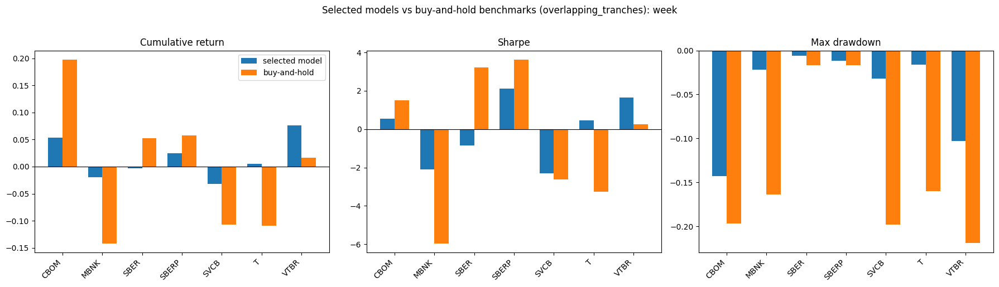

=== Selected model buy-and-hold benchmark: week ===


,horizon_name,horizon,signal_mode,ticker,selected_model_name,selected_comparison_source,selected_model_cumulative_return,selected_model_annualized_return,selected_model_sharpe,selected_model_max_drawdown,selected_model_turnover,selected_model_number_of_trades,buy_hold_cumulative_return,buy_hold_annualized_return,buy_hold_sharpe,buy_hold_max_drawdown,buy_hold_turnover,buy_hold_number_of_trades,excess_cumulative_return,excess_sharpe
0,week,5,overlapping_tranches,CBOM,naive_persistence,table,0.053857,0.110614,0.529273,-0.142612,0.122222,77,0.197468,0.433929,1.505060,-0.196925,0.001587,1,-0.143611,-0.975787
1,week,5,overlapping_tranches,MBNK,ridge,table,-0.019240,-0.044724,-2.106774,-0.021965,0.018692,10,-0.142081,-0.302962,-5.965041,-0.164066,0.001869,1,0.122841,3.858267
2,week,5,overlapping_tranches,SBER,hist_gradient_boosting,table,-0.003021,-0.006034,-0.846157,-0.006205,0.012698,8,0.052694,0.108164,3.210801,-0.016751,0.001587,1,-0.055715,-4.056958
3,week,5,overlapping_tranches,SBERP,ridge,table,0.024419,0.049434,2.120121,-0.011807,0.074603,47,0.057315,0.117915,3.621272,-0.016934,0.001587,1,-0.032896,-1.501152
4,week,5,overlapping_tranches,SVCB,ridge,table,-0.032085,-0.063140,-2.308379,-0.032085,0.014286,9,-0.107314,-0.203113,-2.635335,-0.197940,0.001587,1,0.075230,0.326956
5,week,5,overlapping_tranches,T,ridge,table,0.004720,0.009462,0.455709,-0.016001,0.023810,15,-0.109263,-0.206588,-3.258951,-0.160028,0.001587,1,0.113983,3.714659
6,week,5,overlapping_tranches,VTBR,naive_persistence,table,0.075942,0.157652,1.653150,-0.102839,0.087302,55,0.016467,0.033205,0.260135,-0.219084,0.001587,1,0.059475,1.393016


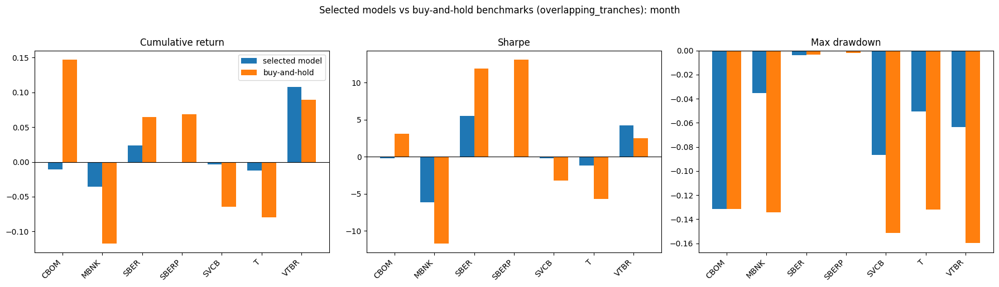

=== Selected model buy-and-hold benchmark: month ===


,horizon_name,horizon,signal_mode,ticker,selected_model_name,selected_comparison_source,selected_model_cumulative_return,selected_model_annualized_return,selected_model_sharpe,selected_model_max_drawdown,selected_model_turnover,selected_model_number_of_trades,buy_hold_cumulative_return,buy_hold_annualized_return,buy_hold_sharpe,buy_hold_max_drawdown,buy_hold_turnover,buy_hold_number_of_trades,excess_cumulative_return,excess_sharpe
0,month,21,overlapping_tranches,CBOM,hist_gradient_boosting,table,-0.010447,-0.020784,-0.230812,-0.131442,0.003023,8,0.146957,0.315510,3.076582,-0.131442,0.000378,1,-0.157403,-3.307394
1,month,21,overlapping_tranches,MBNK,lstm,lstm_only,-0.035372,-0.083563,-6.110315,-0.035372,0.004579,10,-0.117281,-0.260864,-11.703600,-0.134266,0.000458,1,0.081908,5.593286
2,month,21,overlapping_tranches,SBER,naive_persistence,table,0.023687,0.047934,5.517897,-0.003761,0.026455,70,0.064703,0.133593,11.915748,-0.003294,0.000378,1,-0.041017,-6.397851
3,month,21,overlapping_tranches,SBERP,hist_gradient_boosting,table,0.000000,0.000000,NaN,0.000000,0.000000,0,0.068829,0.142396,13.106935,-0.002180,0.000378,1,-0.068829,NaN
4,month,21,overlapping_tranches,SVCB,momentum,table,-0.003460,-0.007019,-0.202521,-0.086445,0.004224,11,-0.064338,-0.126412,-3.209549,-0.151408,0.000384,1,0.060878,3.007027
5,month,21,overlapping_tranches,T,momentum,table,-0.012079,-0.024012,-1.211641,-0.050767,0.004913,13,-0.079474,-0.152633,-5.704972,-0.132143,0.000378,1,0.067396,4.493331
6,month,21,overlapping_tranches,VTBR,naive_persistence,table,0.108122,0.227935,4.241131,-0.063563,0.022298,59,0.089037,0.186001,2.475213,-0.159826,0.000378,1,0.019085,1.765918


In [11]:
BENCHMARK_MODEL_NAME = "buy_and_hold"
BENCHMARK_SOURCE = "benchmark"
BENCHMARK_METRIC_COLS = ["cumulative_return", "annualized_return", "sharpe", "max_drawdown", "turnover", "number_of_trades"]


def selected_per_ticker_model_rows(result: dict) -> pd.DataFrame:
    selected = result.get("selected_models_by_ticker", pd.DataFrame()).copy()
    if selected.empty:
        return selected
    if "is_validation_selected" in selected.columns:
        selected = selected[selected["is_validation_selected"].fillna(False).astype(bool)].copy()
    if "selection_scope" in selected.columns:
        selected = selected[selected["selection_scope"].astype(str).eq("per_ticker")].copy()
    sort_cols = [col for col in ["ticker", "validation_rank", "model_name"] if col in selected.columns]
    if sort_cols:
        selected = selected.sort_values(sort_cols)
    return selected.drop_duplicates("ticker", keep="first").reset_index(drop=True)


def selected_merge_columns(frame: pd.DataFrame, selected: pd.DataFrame) -> list[str]:
    cols = ["ticker", "model_name"]
    if "comparison_source" in frame.columns and "comparison_source" in selected.columns:
        cols.append("comparison_source")
    return cols


def filter_selected_model_rows(frame: pd.DataFrame, selected: pd.DataFrame) -> pd.DataFrame:
    if frame.empty or selected.empty:
        return pd.DataFrame()
    merge_cols = selected_merge_columns(frame, selected)
    selected_keys = selected[merge_cols].drop_duplicates()
    return frame.merge(selected_keys, on=merge_cols, how="inner")


def selected_model_info(selected: pd.DataFrame) -> pd.DataFrame:
    cols = [col for col in ["ticker", "model_name", "comparison_source"] if col in selected.columns]
    info = selected[cols].drop_duplicates("ticker").copy()
    rename_cols = {"model_name": "selected_model_name", "comparison_source": "selected_comparison_source"}
    return info.rename(columns=rename_cols)


def prefixed_benchmark_metrics(frame: pd.DataFrame, prefix: str) -> pd.DataFrame:
    keep_cols = [col for col in BENCHMARK_METRIC_COLS if col in frame.columns]
    id_cols = [col for col in ["ticker", "model_name", "comparison_source"] if col in frame.columns]
    out = frame[id_cols + keep_cols].copy()
    return out.rename(columns={col: f"{prefix}_{col}" for col in keep_cols})


def compute_selected_model_buy_hold_benchmarks(result: dict) -> tuple[pd.DataFrame, pd.DataFrame]:
    selected = selected_per_ticker_model_rows(result)
    if selected.empty:
        return pd.DataFrame(), pd.DataFrame()

    test_predictions = result.get("test_predictions", pd.DataFrame()).copy()
    selected_predictions = filter_selected_model_rows(test_predictions, selected)
    if selected_predictions.empty:
        return pd.DataFrame(), pd.DataFrame()

    selected_signal_metrics = headline_signal_metrics(result.get("test_signal_metrics", pd.DataFrame()))
    if "comparison_source" not in selected_signal_metrics.columns:
        selected_signal_metrics = attach_comparison_source_from_predictions(selected_signal_metrics, test_predictions)
    selected_metrics = filter_selected_model_rows(selected_signal_metrics, selected)

    selected_signal_equity = result.get("test_signal_equity", pd.DataFrame()).copy()
    if not selected_signal_equity.empty and "signal_mode" in selected_signal_equity.columns:
        selected_signal_equity = selected_signal_equity[selected_signal_equity["signal_mode"] == HEADLINE_SIGNAL_MODE].copy()
    if "comparison_source" not in selected_signal_equity.columns:
        selected_signal_equity = attach_comparison_source_from_predictions(selected_signal_equity, test_predictions)
    selected_equity = filter_selected_model_rows(selected_signal_equity, selected)
    if not selected_equity.empty:
        selected_equity["benchmark_leg"] = "selected_model"

    buy_hold_predictions = selected_predictions.copy()
    buy_hold_predictions["selected_model_name"] = buy_hold_predictions["model_name"].astype(str)
    if "comparison_source" in buy_hold_predictions.columns:
        buy_hold_predictions["selected_comparison_source"] = buy_hold_predictions["comparison_source"].astype(str)
    buy_hold_predictions["model_name"] = BENCHMARK_MODEL_NAME
    buy_hold_predictions["comparison_source"] = BENCHMARK_SOURCE
    buy_hold_predictions["y_pred"] = 1.0

    empty_seed = buy_hold_predictions.iloc[0:0].copy()
    buy_hold_equity, buy_hold_metrics = run_test_signal_backtest(
        empty_seed,
        buy_hold_predictions,
        horizon=result["horizon"],
        mode=HEADLINE_SIGNAL_MODE,
        transaction_cost_bps=TRANSACTION_COST_BPS,
        slippage_bps=SLIPPAGE_BPS,
        long_threshold=0.0,
        signal_anchor="zero",
    )
    if not buy_hold_metrics.empty:
        buy_hold_metrics["comparison_source"] = BENCHMARK_SOURCE
    if not buy_hold_equity.empty:
        buy_hold_equity["comparison_source"] = BENCHMARK_SOURCE
        buy_hold_equity["benchmark_leg"] = "buy_and_hold"

    info = selected_model_info(selected)
    selected_metrics_prefixed = prefixed_benchmark_metrics(selected_metrics, "selected_model")
    selected_metrics_prefixed = selected_metrics_prefixed.rename(
        columns={"model_name": "selected_model_name", "comparison_source": "selected_comparison_source"}
    )
    buy_hold_metrics_prefixed = prefixed_benchmark_metrics(buy_hold_metrics, "buy_hold")
    buy_hold_metrics_prefixed = buy_hold_metrics_prefixed.drop(columns=[col for col in ["model_name", "comparison_source"] if col in buy_hold_metrics_prefixed.columns])

    benchmark_metrics = info.merge(selected_metrics_prefixed, on=["ticker", "selected_model_name", "selected_comparison_source"], how="left")
    benchmark_metrics = benchmark_metrics.merge(buy_hold_metrics_prefixed, on="ticker", how="left")
    benchmark_metrics["horizon_name"] = result.get("horizon_name")
    benchmark_metrics["horizon"] = result.get("horizon")
    benchmark_metrics["signal_mode"] = HEADLINE_SIGNAL_MODE
    benchmark_metrics["excess_cumulative_return"] = benchmark_metrics["selected_model_cumulative_return"] - benchmark_metrics["buy_hold_cumulative_return"]
    benchmark_metrics["excess_sharpe"] = benchmark_metrics["selected_model_sharpe"] - benchmark_metrics["buy_hold_sharpe"]

    selected_equity = selected_equity.merge(info, on="ticker", how="left") if not selected_equity.empty else selected_equity
    buy_hold_equity = buy_hold_equity.merge(info, on="ticker", how="left") if not buy_hold_equity.empty else buy_hold_equity
    benchmark_equity = concat_metric_frames([selected_equity, buy_hold_equity])
    if not benchmark_equity.empty:
        benchmark_equity["horizon_name"] = result.get("horizon_name")
        benchmark_equity["horizon"] = result.get("horizon")

    ordered_cols = [
        "horizon_name",
        "horizon",
        "signal_mode",
        "ticker",
        "selected_model_name",
        "selected_comparison_source",
        "selected_model_cumulative_return",
        "selected_model_annualized_return",
        "selected_model_sharpe",
        "selected_model_max_drawdown",
        "selected_model_turnover",
        "selected_model_number_of_trades",
        "buy_hold_cumulative_return",
        "buy_hold_annualized_return",
        "buy_hold_sharpe",
        "buy_hold_max_drawdown",
        "buy_hold_turnover",
        "buy_hold_number_of_trades",
        "excess_cumulative_return",
        "excess_sharpe",
    ]
    benchmark_metrics = benchmark_metrics[[col for col in ordered_cols if col in benchmark_metrics.columns]].sort_values("ticker").reset_index(drop=True)
    return benchmark_metrics, benchmark_equity


def plot_selected_model_buy_hold_benchmarks(horizon_name: str, result: dict) -> None:
    metrics = result.get("selected_model_buy_hold_benchmark_metrics", pd.DataFrame()).copy()
    if metrics.empty:
        return

    metrics = metrics.sort_values("ticker").reset_index(drop=True)
    x = np.arange(len(metrics))
    width = 0.36
    plot_specs = [
        ("cumulative_return", "Cumulative return"),
        ("sharpe", "Sharpe"),
        ("max_drawdown", "Max drawdown"),
    ]
    fig, axes = plt.subplots(1, 3, figsize=(18, 5), squeeze=False)
    for ax, (metric, title) in zip(axes.ravel(), plot_specs):
        selected_col = f"selected_model_{metric}"
        buy_hold_col = f"buy_hold_{metric}"
        ax.bar(x - width / 2, metrics[selected_col].astype(float), width, label="selected model")
        ax.bar(x + width / 2, metrics[buy_hold_col].astype(float), width, label="buy-and-hold")
        ax.axhline(0, color="black", linewidth=0.8)
        ax.set_title(title)
        ax.set_xticks(x)
        ax.set_xticklabels(metrics["ticker"].astype(str), rotation=45, ha="right")
    axes.ravel()[0].legend()
    fig.suptitle(f"Selected models vs buy-and-hold benchmarks ({HEADLINE_SIGNAL_MODE}): {horizon_name}", y=1.02)
    fig.tight_layout()
    fig.savefig(result["summary_plots_dir"] / "selected_models_vs_buy_hold_benchmarks.png", dpi=150, bbox_inches="tight")
    plt.show()


for horizon_name, result in horizon_results.items():
    benchmark_metrics, benchmark_equity = compute_selected_model_buy_hold_benchmarks(result)
    if not benchmark_metrics.empty:
        benchmark_metrics["horizon_name"] = horizon_name
    if not benchmark_equity.empty:
        benchmark_equity["horizon_name"] = horizon_name
    result["selected_model_buy_hold_benchmark_metrics"] = benchmark_metrics
    result["selected_model_buy_hold_benchmark_equity"] = benchmark_equity
    if not benchmark_metrics.empty:
        save_table(benchmark_metrics, result["reports_dir"] / "selected_model_buy_hold_benchmark_metrics.parquet")
    if not benchmark_equity.empty:
        save_table(benchmark_equity, result["reports_dir"] / "selected_model_buy_hold_benchmark_equity.parquet")
    plot_selected_model_buy_hold_benchmarks(horizon_name, result)
    print(f"=== Selected model buy-and-hold benchmark: {horizon_name} ===")
    display(benchmark_metrics)


## Final Strict Comparison Report

In [12]:
combined_payload = {"primary_metric": PRIMARY_METRIC, "signal_mode": HEADLINE_SIGNAL_MODE, "horizons": {}}
combined_lines = [
    "# Strict Validation And Test Model Comparison",
    "",
    "This is research code, not financial advice.",
    "",
    f"Primary validation ranking metric: `{PRIMARY_METRIC}`",
    f"Headline signal mode: `{HEADLINE_SIGNAL_MODE}`",
    "",
    "Validation metrics are model-selection diagnostics; test metrics remain out-of-sample evaluation.",
]

for horizon_name, result in horizon_results.items():
    reports_dir = result["reports_dir"]
    payload = {
        "horizon_name": horizon_name,
        "horizon": result["horizon"],
        "outer_splits": result["outer_splits"].to_dict(orient="records"),
        "validation_model_ranking": result["validation_model_ranking"].to_dict(orient="records"),
        "selected_models_by_ticker": result["selected_models_by_ticker"].to_dict(orient="records"),
        "validation_prediction_metrics": result["validation_prediction_metrics"].to_dict(orient="records"),
        "validation_signal_metrics": result["validation_signal_metrics"].to_dict(orient="records"),
        "validation_panel_signal_metrics": result.get("validation_panel_signal_metrics", pd.DataFrame()).to_dict(orient="records"),
        "validation_model_metric_comparison": result["validation_model_metric_comparison"].to_dict(orient="records"),
        "lstm_hyperparameter_summary": result.get("lstm_hyperparameter_summary", pd.DataFrame()).to_dict(orient="records"),
        "test_prediction_metrics": result["test_prediction_metrics"].to_dict(orient="records"),
        "test_signal_metrics": result["test_signal_metrics"].to_dict(orient="records"),
        "test_panel_signal_metrics": result.get("test_panel_signal_metrics", pd.DataFrame()).to_dict(orient="records"),
        "selected_model_buy_hold_benchmark_metrics": result.get("selected_model_buy_hold_benchmark_metrics", pd.DataFrame()).to_dict(orient="records"),
        "leakage_audit": result["leakage_audit"].to_dict(orient="records"),
        "artifacts": {
            "test_predictions": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/comparison_test_predictions.parquet",
            "validation_predictions": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/comparison_validation_predictions.parquet",
            "outer_splits": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/outer_splits.parquet",
            "validation_prediction_metrics": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/comparison_validation_prediction_metrics.parquet",
            "test_prediction_metrics": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/comparison_test_prediction_metrics.parquet",
            "validation_signal_metrics": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/comparison_validation_signal_metrics.parquet",
            "test_signal_metrics": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/comparison_test_signal_metrics.parquet",
            "validation_panel_signal_metrics": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/comparison_validation_panel_signal_metrics.parquet",
            "validation_model_metric_comparison": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/validation_model_metric_comparison.parquet",
            "lstm_hyperparameter_summary": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/lstm_hyperparameter_summary.parquet",
            "test_panel_signal_metrics": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/comparison_test_panel_signal_metrics.parquet",
            "selected_model_buy_hold_benchmark_metrics": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/selected_model_buy_hold_benchmark_metrics.parquet",
            "selected_model_buy_hold_benchmark_equity": f"artifacts/horizons/{horizon_name}/strict_protocol/reports/selected_model_buy_hold_benchmark_equity.parquet",
            "selected_models_vs_buy_hold_benchmarks_plot": f"artifacts/horizons/{horizon_name}/strict_protocol/plots/summary/selected_models_vs_buy_hold_benchmarks.png",
            "global_lstm_reports": f"artifacts/horizons/{horizon_name}/global_lstm/strict_protocol/reports/",
            "ticker_plots": f"artifacts/horizons/{horizon_name}/strict_protocol/plots/tickers/",
            "summary_plots": f"artifacts/horizons/{horizon_name}/strict_protocol/plots/summary/",
        },
    }
    save_json(payload, reports_dir / "final_strict_comparison.json")
    combined_payload["horizons"][horizon_name] = payload

    lines = [
        f"# Strict Validation And Test Model Comparison: {horizon_name}",
        "",
        "This is research code, not financial advice.",
        "",
        f"Horizon: `{result['horizon']}` trading days",
        f"Primary validation ranking metric: `{PRIMARY_METRIC}`",
        f"Headline signal mode: `{HEADLINE_SIGNAL_MODE}`",
        "",
        "## Outer Splits",
        "",
        "```text\n" + result["outer_splits"].to_string(index=False) + "\n```",
        "",
        "## Validation Model Ranking",
        "",
        "```text\n" + result["validation_model_ranking"].to_string(index=False) + "\n```",
        "",
        "## Validation-Selected Models",
        "",
        "```text\n" + result["selected_models_by_ticker"].to_string(index=False) + "\n```",
        "",
        "## Validation Signal Metrics",
        "",
        "```text\n" + result["validation_signal_metrics"].to_string(index=False) + "\n```",
        "",
        "## Validation Panel Signal Metrics",
        "",
        "```text\n" + result.get("validation_panel_signal_metrics", pd.DataFrame()).to_string(index=False) + "\n```",
        "",
        "## Validation-Vs-Test Model Metric Comparison",
        "",
        "```text\n" + result["validation_model_metric_comparison"].to_string(index=False) + "\n```",
        "",
        "## LSTM Hyperparameter Summary",
        "",
        "```text\n" + result.get("lstm_hyperparameter_summary", pd.DataFrame()).to_string(index=False) + "\n```",
        "",
        "## Test Prediction Metrics",
        "",
        "```text\n" + result["test_prediction_metrics"].to_string(index=False) + "\n```",
        "",
        "## Test Signal Metrics",
        "",
        "```text\n" + result["test_signal_metrics"].to_string(index=False) + "\n```",
        "",
        "## Test Panel Signal Metrics",
        "",
        "```text\n" + result.get("test_panel_signal_metrics", pd.DataFrame()).to_string(index=False) + "\n```",
        "",
        "## Selected Model Buy-And-Hold Benchmarks",
        "",
        "```text\n" + result.get("selected_model_buy_hold_benchmark_metrics", pd.DataFrame()).to_string(index=False) + "\n```",
        "",
        "## Leakage Audit",
        "",
        "```text\n" + result["leakage_audit"].to_string(index=False) + "\n```",
    ]
    (reports_dir / "final_strict_comparison.md").write_text("\n".join(lines), encoding="utf-8")
    combined_lines.extend(["", f"## {horizon_name.title()} Horizon", ""] + lines[8:])

save_json(combined_payload, REPORTS_DIR / "final_strict_comparison.json")
(REPORTS_DIR / "final_strict_comparison.md").write_text("\n".join(combined_lines), encoding="utf-8")


337227